<span style="color:red; font-family:Helvetica Neue, Helvetica, Arial, sans-serif; font-size:2em;">An Exception was encountered at '<a href="#papermill-error-cell">In [72]</a>'.</span>

using __dna_diffusion_working_ml008__ conda enviroment  
now using the dna_diffusion_python_3_9_16  # sometjing similar

# Installs and Downloads

In [5]:
!nvidia-smi

zsh:1: command not found: nvidia-smi


In [6]:
DATA_PATH = 'K562_hESCT0_HepG2_GM12878_12k_sequences_per_group.txt'
NUMBER_OF_SAMPLING_TO_COMPARE_CELLS = 1000  # Or None to use everything
SAVE_MODELS_BY_EPOCH = False  # This will save a model with a different name and add the current epoch to the name
TIME_STEPS = 50
IMAGE_SIZE = 200
N_SAMPLES_TO_TEST_METRICS = 1000
EPOCHS = 10000
SAVE_AND_SAMPLE_EVERY_N_EPOCH = 50
EPOCH_LOSS_SHOW_INTERVAL = 5
BATCH_SIZE = 240
LIMIT_TOTAL_SEQUENCES = 100  # False # OR False to use everything
MODEL_NAME = 'model_48k_sequences_per_group_K562_hESCT0_HepG2_GM12878_12k'
NUMBER_OF_GPUS = 8

In [7]:

%env NCCL_DEBUG=info
%env NCCL_IB_DISABLE=1
%env CUDA_LAUNCH_BLOCKING=1
%env NCCL_IB_GID_INDEX=0
%env NCCL_P2P_DISABLE=1
%env NCCL_SHM_DISABLE=1

env: NCCL_DEBUG=info
env: NCCL_IB_DISABLE=1
env: CUDA_LAUNCH_BLOCKING=1
env: NCCL_IB_GID_INDEX=0
env: NCCL_P2P_DISABLE=1
env: NCCL_SHM_DISABLE=1


# Importing

In [8]:
import os

os.getpid()
from scipy.stats import zscore
import torch
import copy
from torch.utils.data import DataLoader, Dataset
import torchvision.transforms as T
import torch
from IPython.display import display
import torch.nn as nn
from torchvision.utils import make_grid
from torchvision.utils import save_image
from IPython.display import Image
import matplotlib.pyplot as plt
import numpy as np
import random
import pandas as pd
from tqdm import tqdm_notebook
import seaborn as sns
import matplotlib.pyplot as plt
from torch.nn.modules.activation import ReLU
from torch.optim import Adam
from tqdm import tqdm_notebook
from torchvision.utils import save_image
import matplotlib
import math
from inspect import isfunction
from functools import partial
import scipy
from scipy.special import rel_entr
from torch import nn, einsum
import torch.nn.functional as F
import matplotlib.pyplot as plt
from tqdm.auto import tqdm
from einops import rearrange
from torch import nn, einsum
import torch.nn.functional as F
import matplotlib.animation as animation
import matplotlib.image as mpimg
import glob
from PIL import Image

%matplotlib inline
from accelerate import Accelerator

In [9]:
torch.cuda.is_initialized()

False

In [10]:
#!mamba install -c anaconda scipy -y
#!mamba install -c pytorch torchvision -y
#!conda install -c pytorch torchvision -y
#!pip install torchvision
#!mamba install -c conda-forge matplotlib -y
#!mamba install -c conda-forge pandas -y
#!mamba install -c conda-forge seaborn -y
#!mamba install -c conda-forge einops -y
# !pip install gimmemotifs    #can takes around 10 minutes
# !genomepy install hg38
#!pip install memory-efficient-attention-pytorch
#!pip install ipywidgets widgetsnbextension pandas-profiling
#!jupyter nbextension enable --py widgetsnbextension
#!mamba  install -c conda-forge jupyterlab_widgets -y
#!mamba  install -c conda-forge ipywidgets -y
#!pip install livelossplot
#!mamba install -c conda-forge accelerate -y

In [11]:
import os

# I use accelerate config on the terminal to configure the GPU and machine numbers

In [12]:
#!mamba install -c anaconda scipy -y

# Utils

In [13]:
class EMA:  # https://github.com/dome272/Diffusion-Models-pytorch/blob/main/modules.py
    def __init__(self, beta):
        super().__init__()
        self.beta = beta
        self.step = 0

    def update_model_average(self, ma_model, current_model):
        for current_params, ma_params in zip(current_model.parameters(), ma_model.parameters()):
            old_weight, up_weight = ma_params.data, current_params.data
            ma_params.data = self.update_average(old_weight, up_weight)

    def update_average(self, old, new):
        if old is None:
            return new
        return old * self.beta + (1 - self.beta) * new

    def step_ema(self, ema_model, model, step_start_ema=2000):
        if self.step < step_start_ema:
            self.reset_parameters(ema_model, model)
            self.step += 1
            return
        self.update_model_average(ema_model, model)
        self.step += 1

    def reset_parameters(self, ema_model, model):
        ema_model.load_state_dict(model.state_dict())

In [14]:
nucleotides = ['A', 'C', 'T', 'G']


def one_hot_encode(seq, alphabet, max_seq_len):
    """One-hot encode a sequence."""
    seq_len = len(seq)
    seq_array = np.zeros((max_seq_len, len(alphabet)))
    for i in range(seq_len):
        seq_array[i, alphabet.index(seq[i])] = 1
    return seq_array


def encode(seq, alphabet):
    """Encode a sequence."""
    seq_len = len(seq)
    seq_array = np.zeros(len(alphabet))
    for i in range(seq_len):
        seq_array[alphabet.index(seq[i])] = 1

    return seq_array


def show_seq(dataloader_seq):
    for i_image in dataloader_seq:
        for image in i_image:
            image = image.numpy().reshape(4, 200)
            print(image)
            plt.rcParams["figure.figsize"] = (20, 1)
            pd_seq = pd.DataFrame(image)
            pd_seq.index = nucleotides
            sns.heatmap(pd_seq, linewidth=1, cmap='bwr', center=0)
            plt.show()


class SequenceDataset(Dataset):
    'Characterizes a dataset for PyTorch'

    def __init__(self, seqs, c, transform=None):
        'Initialization'
        self.seqs = seqs
        self.c = c
        self.transform = transform

    def __len__(self):
        'Denotes the total number of samples'
        return len(self.seqs)

    def __getitem__(self, index):
        'Generates one sample of data'
        # Select sample
        image = self.seqs[index]

        x = self.transform(image)

        y = self.c[index]

        return x, y

In [15]:
torch.cuda.is_initialized()

False

## Motif Metric

In [16]:
def sampling_to_metric(
    number_of_samples=20, specific_group=False, group_number=None, cond_weight_to_metric=0, additional_variables=None
):
    # Sampling regions using the trained  model
    final_sequences = []
    for n_a in tqdm_notebook(range(number_of_samples)):  # generating number_of_samples *10 sequences
        # sampled_images = bit_diffusion.sample(batch_size = 4)
        print(n_a)
        sample_bs = 10
        if specific_group:
            sampled = torch.from_numpy(np.array([group_number] * sample_bs))
            # print ('specific')
        else:
            sampled = torch.from_numpy(np.random.choice(cell_types, sample_bs))

        #         random_classes = torch.zeros((sample_bs, TOTAL_class_number))
        #         random_classes = random_classes.scatter_(1, sampled.unsqueeze(dim=1), 1).float().cuda()
        random_classes = sampled.float()  # .cuda() to accelerate
        if additional_variables:
            random_classes = random_classes.to(additional_variables['device'])

        sampled_images = sample(
            classes=random_classes,
            batch_size=sample_bs,
            channels=1,
            cond_weight=cond_weight_to_metric,
            **additional_variables,
        )
        # sampled_images = sampled_images
        for n_b, x in enumerate(sampled_images[-1]):
            # x = x[-1]
            # print(x.shape)
            seq_final = f'>seq_test_{n_a}_{n_b}\n' + ''.join(
                [nucleotides[s] for s in np.argmax(x.reshape(4, 200), axis=0)]
            )
            final_sequences.append(seq_final)

    save_motifs_syn = open('synthetic_motifs.fasta', 'w')

    save_motifs_syn.write('\n'.join(final_sequences))
    save_motifs_syn.close()
    # Scan for motifs
    !gimme scan synthetic_motifs.fasta -p   JASPAR2020_vertebrates -g hg38 > syn_results_motifs.bed
    df_results_syn = pd.read_csv('syn_results_motifs.bed', sep='\t', skiprows=5, header=None)
    df_results_syn['motifs'] = df_results_syn[8].apply(lambda x: x.split('motif_name "')[1].split('"')[0])
    df_results_syn[0] = df_results_syn[0].apply(lambda x: '_'.join(x.split('_')[:-1]))
    df_motifs_count_syn = df_results_syn[[0, 'motifs']].drop_duplicates().groupby('motifs').count()
    plt.rcParams["figure.figsize"] = (30, 2)
    df_motifs_count_syn.sort_values(0, ascending=False).head(50)[0].plot.bar()
    plt.show()

    return df_motifs_count_syn


# sampling_to_metric(10)

In [17]:
# np.random.randint(0,2)

In [18]:
# Not using the total number of motifs but the count of the occurence aka: percentage of the sequences with a given motif.
def compare_motif_list(df_motifs_a, df_motifs_b):
    # Using KL divergence to compare motifs lists distribution
    set_all_mot = set(df_motifs_a.index.values.tolist() + df_motifs_b.index.values.tolist())
    create_new_matrix = []
    for x in set_all_mot:
        list_in = []
        list_in.append(x)  # adding the name
        if x in df_motifs_a.index:
            list_in.append(df_motifs_a.loc[x][0])
        else:
            list_in.append(1)

        if x in df_motifs_b.index:
            list_in.append(df_motifs_b.loc[x][0])
        else:
            list_in.append(1)

        create_new_matrix.append(list_in)

    df_motifs = pd.DataFrame(create_new_matrix, columns=['motif', 'motif_a', 'motif_b'])

    df_motifs['Diffusion_seqs'] = df_motifs['motif_a'] / df_motifs['motif_a'].sum()
    df_motifs['Training_seqs'] = df_motifs['motif_b'] / df_motifs['motif_b'].sum()
    plt.rcParams["figure.figsize"] = (3, 3)
    sns.regplot(x='Diffusion_seqs', y='Training_seqs', data=df_motifs)
    plt.xlabel('Diffusion Seqs')
    plt.ylabel('Training Seqs')
    plt.title('Motifs Probs')
    plt.show()

    display(df_motifs)
    kl_pq = rel_entr(df_motifs['Diffusion_seqs'].values, df_motifs['Training_seqs'].values)
    return np.sum(kl_pq)


# compare_motif_list(synt_df, df_results_seq_guime_count)

# Diffusion

In [19]:
# modified 1/20/23
from functools import partial


# ALL THIS FUNCTIONS CHANGED WITH THE CONDITIONAL CODE
@torch.no_grad()
def p_sample(model, x, t, t_index):
    betas_t = extract(betas, t, x.shape)
    sqrt_one_minus_alphas_cumprod_t = extract(sqrt_one_minus_alphas_cumprod, t, x.shape)
    # print (x.shape, 'x_shape')
    sqrt_recip_alphas_t = extract(sqrt_recip_alphas, t, x.shape)

    # Equation 11 in the paper
    # Use our model (noise predictor) to predict the mean
    model_mean = sqrt_recip_alphas_t * (x - betas_t * model(x, time=t) / sqrt_one_minus_alphas_cumprod_t)

    if t_index == 0:
        return model_mean
    else:
        posterior_variance_t = extract(posterior_variance, t, x.shape)
        noise = torch.randn_like(x)
        # Algorithm 2 line 4:
        return model_mean + torch.sqrt(posterior_variance_t) * noise


@torch.no_grad()
def p_sample_guided(
    model,
    x,
    classes,
    t,
    t_index,
    context_mask,
    cond_weight=0.0,
    betas=None,
    sqrt_one_minus_alphas_cumprod=None,
    sqrt_recip_alphas=None,
    posterior_variance=None,
    device=None,
    accelerator=None,
):
    # adapted from: https://openreview.net/pdf?id=qw8AKxfYbI
    # print (classes[0])
    batch_size = x.shape[0]
    # double to do guidance with
    t_double = t.repeat(2).to(device)
    x_double = x.repeat(2, 1, 1, 1).to(device)
    betas = betas.to(device)
    sqrt_one_minus_alphas_cumprod = sqrt_one_minus_alphas_cumprod.to(device)
    betas_t = extract(betas, t_double, x_double.shape, device=device)
    sqrt_one_minus_alphas_cumprod_t = extract(sqrt_one_minus_alphas_cumprod, t_double, x_double.shape, device=device)
    sqrt_recip_alphas_t = extract(sqrt_recip_alphas, t_double, x_double.shape, device=device)

    # classifier free sampling interpolates between guided and non guided using `cond_weight`
    classes_masked = classes * context_mask
    classes_masked = classes_masked.type(torch.long)
    # print ('class masked', classes_masked)
    if accelerator:
        model = accelerator.unwrap_model(model)
    model.output_attention = True
    show_out_test = model(x_double, time=t_double, classes=classes_masked)
    # print(x_double.shape, t_double.shape, 'x_double and t_double')
    # print (show_out_test.shape, 'show_out_test')
    # print (show_out_test)
    # print (show_out_test[0])
    # print (show_out_test[1])
    # print (show_out_test[2])
    # print (show_out_test[3])
    preds, cross_map_full = model(x_double, time=t_double, classes=classes_masked)  # I added cross_map
    model.output_attention = False
    cross_map = cross_map_full[:batch_size]
    eps1 = (1 + cond_weight) * preds[:batch_size]
    eps2 = cond_weight * preds[batch_size:]
    x_t = eps1 - eps2

    # Equation 11 in the paper
    # Use our model (noise predictor) to predict the mean
    model_mean = sqrt_recip_alphas_t[:batch_size] * (
        x - betas_t[:batch_size] * x_t / sqrt_one_minus_alphas_cumprod_t[:batch_size]
    )

    if t_index == 0:
        return model_mean, cross_map
    else:
        posterior_variance_t = extract(posterior_variance, t, x.shape, device=device)
        noise = torch.randn_like(x)
        # Algorithm 2 line 4:
        return model_mean + torch.sqrt(posterior_variance_t) * noise, cross_map


# Algorithm 2 but save all images:
@torch.no_grad()
def p_sample_loop(
    model,
    classes,
    shape,
    cond_weight,
    get_cross_map=False,
    timesteps=None,
    device=None,
    betas=None,
    sqrt_one_minus_alphas_cumprod=None,
    sqrt_recip_alphas=None,
    posterior_variance=None,
    accelerator=None,
):  # to accelerate add timesteps
    # device = next(model.parameters()).device # to accelerate

    b = shape[0]
    # start from pure noise (for each example in the batch)
    img = torch.randn(shape, device=device)  # to accelerate
    imgs = []
    cross_images_final = []

    if classes is not None:
        n_sample = classes.shape[0]
        context_mask = torch.ones_like(classes).to(device)
        # make 0 index unconditional
        # double the batch
        classes = classes.repeat(2)
        context_mask = context_mask.repeat(2)
        context_mask[n_sample:] = 0.0  # makes second half of batch context free
        sampling_fn = partial(
            p_sample_guided,
            classes=classes,
            cond_weight=cond_weight,
            context_mask=context_mask,
            betas=betas,
            device=device,
            sqrt_one_minus_alphas_cumprod=sqrt_one_minus_alphas_cumprod,
            sqrt_recip_alphas=sqrt_recip_alphas,
            posterior_variance=posterior_variance,
            accelerator=accelerator,
        )  # to accelerate betas
    else:
        sampling_fn = partial(p_sample)

    for i in tqdm(reversed(range(0, timesteps)), desc='sampling loop time step', total=timesteps):
        img, cross_matrix = sampling_fn(model, x=img, t=torch.full((b,), i, device=device, dtype=torch.long), t_index=i)
        imgs.append(img.cpu().numpy())
        cross_images_final.append(cross_matrix.cpu().numpy())
    if get_cross_map:
        return imgs, cross_images_final
    else:
        return imgs


print('1')


@torch.no_grad()
def sample(
    model,
    image_size,
    classes=None,
    batch_size=16,
    channels=3,
    cond_weight=0,
    get_cross_map=False,
    timesteps=None,
    device=None,
    betas=None,
    sqrt_one_minus_alphas_cumprod=None,
    sqrt_recip_alphas=None,
    posterior_variance=None,
    accelerator=None,
):  # to accelerate add timesteps, device , betas
    return p_sample_loop(
        model,
        classes=classes,
        shape=(batch_size, channels, 4, image_size),
        cond_weight=cond_weight,
        get_cross_map=get_cross_map,
        timesteps=timesteps,
        device=device,
        betas=betas,
        sqrt_one_minus_alphas_cumprod=sqrt_one_minus_alphas_cumprod,
        sqrt_recip_alphas=sqrt_recip_alphas,
        posterior_variance=posterior_variance,
        accelerator=accelerator,
    )  # to accelerate add timesteps device

1


In [20]:
torch.cuda.is_initialized()

False

### schedule

In [21]:
def cosine_beta_schedule(timesteps, s=0.008):
    """
    cosine schedule as proposed in https://arxiv.org/abs/2102.09672
    """
    steps = timesteps + 1
    x = torch.linspace(0, timesteps, steps)
    alphas_cumprod = torch.cos(((x / timesteps) + s) / (1 + s) * torch.pi * 0.5) ** 2
    alphas_cumprod = alphas_cumprod / alphas_cumprod[0]
    betas = 1 - (alphas_cumprod[1:] / alphas_cumprod[:-1])
    return torch.clip(betas, 0.0001, 0.9999)


def linear_beta_schedule(timesteps, beta_end=0.005):
    beta_start = 0.0001

    return torch.linspace(beta_start, beta_end, timesteps)


def quadratic_beta_schedule(timesteps):
    beta_start = 0.0001
    beta_end = 0.02
    return torch.linspace(beta_start**0.5, beta_end**0.5, timesteps) ** 2


def sigmoid_beta_schedule(timesteps):
    beta_start = 0.001
    beta_end = 0.02
    betas = torch.linspace(-6, 6, timesteps)
    return torch.sigmoid(betas) * (beta_end - beta_start) + beta_start

### Foward diffusion


In [22]:
# forward diffusion
def q_sample(x_start, t, sqrt_alphas_cumprod, sqrt_one_minus_alphas_cumprod, noise=None, device=None):
    if noise is None:
        noise = torch.randn_like(x_start)

    sqrt_alphas_cumprod_t = extract(sqrt_alphas_cumprod, t, x_start.shape).to(device)
    sqrt_one_minus_alphas_cumprod_t = extract(sqrt_one_minus_alphas_cumprod, t, x_start.shape).to(device)

    # print  (sqrt_alphas_cumprod_t , sqrt_one_minus_alphas_cumprod_t , t)
    # print (sqrt_alphas_cumprod_t.device, 'sqrt_alphas_cumprod_t')
    # print (x_start.device, 'x_start' )
    # print (sqrt_one_minus_alphas_cumprod_t.device , 'sqrt_one_minus_alphas_cumprod_t')
    # print (noise.device , 'noise.device')
    return sqrt_alphas_cumprod_t * x_start + sqrt_one_minus_alphas_cumprod_t * noise

In [23]:
torch.cuda.is_initialized()

False

In [24]:
torch.bernoulli(torch.zeros(10) + (1 - 0.1)).device

device(type='cpu')

### Loss

In [25]:
# THIS function changed to accomodate the conditional


def p_losses(
    denoise_model,
    x_start,
    t,
    classes,
    noise=None,
    loss_type="l1",
    p_uncond=0.1,
    sqrt_alphas_cumprod_in=None,
    sqrt_one_minus_alphas_cumprod_in=None,
    device=None,
):
    # device = x_start.device # to accelerate
    if noise is None:
        noise = torch.randn_like(x_start)  #  guass noise
    x_noisy = q_sample(
        x_start=x_start,
        t=t,
        sqrt_alphas_cumprod=sqrt_alphas_cumprod_in,
        sqrt_one_minus_alphas_cumprod=sqrt_one_minus_alphas_cumprod_in,
        noise=noise,
        device=device,
    )  # this is the auto generated noise given t and Noise
    # print('max_q_sample', x_noisy.max(), 'mean_q_sample',x_noisy.mean() )

    context_mask = torch.bernoulli(torch.zeros(classes.shape[0]) + (1 - p_uncond)).to(device)
    # print ('context mask', context_mask)
    # print ('classes', classes)

    # mask for unconditinal guidance
    classes = classes * context_mask
    # nn.Embedding needs type to be long, multiplying with mask changes type
    classes = classes.type(torch.long)
    # print ('final class',classes )
    predicted_noise = denoise_model(x_noisy, t, classes)  # this is the predicted noise given the model and step t
    # print('max_predicted', x_noisy.max(), 'mean_predicted',x_noisy.mean() )

    # #predicted is ok (clipped)
    # print ('predited inside loss')
    # print (predicted_noise)
    # print ('this is the noise generated by the p_losses')
    # print (noise)
    if loss_type == 'l1':
        loss = F.l1_loss(noise, predicted_noise)
    elif loss_type == 'l2':
        # print (noise.shape, 'noise' )
        # print (predicted_noise.shape, 'pred')
        loss = F.mse_loss(noise, predicted_noise)
    elif loss_type == "huber":
        loss = F.smooth_l1_loss(noise, predicted_noise)
    else:
        raise NotImplementedError()

    return loss

# Models

In [26]:
class SinusoidalPositionEmbeddings(nn.Module):
    def __init__(self, dim):
        super().__init__()
        self.dim = dim

    def forward(self, time):
        # device = time.device # to accelerate
        half_dim = self.dim // 2
        embeddings = math.log(10000) / (half_dim - 1)
        # embeddings = torch.exp(torch.arange(half_dim, device=device) * -embeddings) # to accelerate
        embeddings = torch.exp(torch.arange(half_dim) * -embeddings)

        embeddings = time[:, None] * embeddings[None, :]
        embeddings = torch.cat((embeddings.sin(), embeddings.cos()), dim=-1)
        return embeddings


class ResBlock(nn.Module):

    """
    Iniialize a residual block with two convolutions followed by batchnorm layers
    """

    def __init__(self, in_size: int, hidden_size: int, out_size: int):
        super().__init__()
        self.conv1 = nn.Conv2d(in_size, hidden_size, 3, padding=1)
        self.conv2 = nn.Conv2d(hidden_size, out_size, 3, padding=1)
        self.batchnorm1 = nn.BatchNorm2d(hidden_size)
        self.batchnorm2 = nn.BatchNorm2d(out_size)

    def convblock(self, x):
        x = F.relu(self.batchnorm1(self.conv1(x)))
        x = F.relu(self.batchnorm2(self.conv2(x)))
        return x

    """
    Combine output with the original input
    """

    def forward(self, x):
        return x + self.convblock(x)  # skip connection


class ConvBlock_2d(nn.Module):
    def __init__(self, in_channels, out_channels):
        super().__init__()

        self.conv1 = nn.Sequential(
            nn.Conv2d(in_channels, out_channels, 4, padding=2),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(),
        )
        self.conv2 = nn.Sequential(
            nn.Conv2d(out_channels, out_channels, 4, 1, 1),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(),
        )

        self._init_weights()

    def _init_weights(self):
        for m in self.modules():
            if isinstance(m, nn.Conv2d):
                nn.init.kaiming_normal_(m.weight)
                if m.bias is not None:
                    nn.init.zeros_(m.bias)
            elif isinstance(m, nn.BatchNorm2d):
                nn.init.constant_(m.weight, 1)
                nn.init.zeros_(m.bias)

    def forward(self, x):
        # print ('x', x.shape)
        x = self.conv1(x)
        # print ('conv1', x.shape)
        x = self.conv2(x)
        # print ('conv2', x.shape)
        # x = F.avg_pool2d(x, 2)

        return x


class Classifier(nn.Module):
    def __init__(self):
        super().__init__()

        self.res = nn.Sequential(ResBlock(1, 2, 1), ResBlock(1, 2, 1), ResBlock(1, 2, 1), ResBlock(1, 2, 1))

        self.conv = nn.Sequential(
            ConvBlock_2d(in_channels=1, out_channels=2),
            nn.ReLU(),
            nn.BatchNorm2d(2),
            ConvBlock_2d(in_channels=2, out_channels=4),
            nn.ReLU(),
            nn.BatchNorm2d(4),
            ConvBlock_2d(in_channels=4, out_channels=1),
            nn.BatchNorm2d(1)
            # ConvBlock_2d(in_channels=1, out_channels=1),
            # ConvBlock_2d(in_channels=1, out_channels=1),
            # ConvBlock_2d(in_channels=1, out_channels=1),
        )

        self.fc = nn.Sequential(
            nn.Linear(800, 800),
            # nn.GELU(),
            nn.BatchNorm1d(800),  # ALWAYS BATCHNORM THIS CHANGES A LOT THE RESULTS
            # nn.Linear(400, 400),
            # nn.BatchNorm1d(400),
            # nn.GELU(),
            # nn.BatchNorm1d(400),
        )

        self.fc2 = nn.Sequential(
            nn.Linear(400, 800),
            # nn.GELU(),
            nn.BatchNorm1d(800),  # ALWAYS BATCHNORM THIS CHANGES A LOT THE RESULTS
            # nn.Linear(400, 400),
            # nn.GELU(),
            # nn.BatchNorm1d(400),
        )

        time_dim = 200 * 4
        self.time_mlp = nn.Sequential(
            SinusoidalPositionEmbeddings(100),
            nn.Linear(100, time_dim),
            nn.GELU(),
            nn.Linear(time_dim, time_dim),
        )

        self.time_mlp_out = nn.Sequential(
            SinusoidalPositionEmbeddings(100),
            nn.Linear(100, time_dim),
            nn.GELU(),
            nn.Linear(time_dim, time_dim),
        )

    def forward(self, x, y):
        # print (x.shape, 'inside model x ')
        x_a = x.clone()
        # y_a = y.clone()
        x = self.res(x)

        # print ('to_full', x.shape)

        y_emb = self.time_mlp(y)
        # y_emb_out = self.time_mlp_out(y_a)

        x = x.view(-1, 800)

        x_a = x.view(-1, 800)
        x_a = self.fc(x_a)

        x = x + y_emb.view(-1, 800) * x_a

        # x = self.fc2(x)
        # x = x + y_emb_out.view(-1,400) + x_a

        # x = torch.clip(x, min=-1, max=1)
        x = x.view(-1, 1, 4, 200)

        # x = x.view(-1,1,200,4)

        # print (x.shape)
        # The cliping is working already checked
        return x

In [27]:
torch.cuda.is_initialized()

False

### UNET and UTILS

In [28]:
# THIS is a new function  to accomodate the conditional


class EmbedFC(nn.Module):
    def __init__(self, input_dim, emb_dim):
        super(EmbedFC, self).__init__()
        '''
        generic one layer FC NN for embedding things  
        '''
        self.input_dim = input_dim
        layers = [nn.Linear(input_dim, emb_dim), nn.GELU(), nn.Linear(emb_dim, emb_dim)]
        self.model = nn.Sequential(*layers)

    def forward(self, x):
        return self.model(x)

In [2]:
# This session changed a lot to accomodate the conditional generation
from memory_efficient_attention_pytorch import Attention as EfficientAttention


def exists(x):
    return x is not None


def default(val, d):
    if exists(val):
        return val
    return d() if callable(d) else d


def cycle(dl):
    while True:
        for data in dl:
            yield data


def has_int_squareroot(num):
    return (math.sqrt(num) ** 2) == num


def num_to_groups(num, divisor):
    groups = num // divisor
    remainder = num % divisor
    arr = [divisor] * groups
    if remainder > 0:
        arr.append(remainder)
    return arr


def convert_image_to(img_type, image):
    if image.mode != img_type:
        return image.convert(img_type)
    return image


def l2norm(t):
    return F.normalize(t, dim=-1)


# small helper modules


def default(val, d):
    if exists(val):
        return val
    return d() if callable(d) else d


class Residual(nn.Module):
    def __init__(self, fn):
        super().__init__()
        self.fn = fn

    def forward(self, x, *args, **kwargs):
        return self.fn(x, *args, **kwargs) + x


def Upsample(dim, dim_out=None):
    return nn.Sequential(
        nn.Upsample(scale_factor=2, mode='nearest'), nn.Conv2d(dim, default(dim_out, dim), 3, padding=1)
    )


def Downsample(dim, dim_out=None):
    return nn.Conv2d(dim, default(dim_out, dim), 4, 2, 1)


class LayerNorm(nn.Module):
    def __init__(self, dim):
        super().__init__()
        self.g = nn.Parameter(torch.ones(1, dim, 1, 1))

    def forward(self, x):
        eps = 1e-5 if x.dtype == torch.float32 else 1e-3
        var = torch.var(x, dim=1, unbiased=False, keepdim=True)
        mean = torch.mean(x, dim=1, keepdim=True)
        return (x - mean) * (var + eps).rsqrt() * self.g


class PreNorm(nn.Module):
    def __init__(self, dim, fn):
        super().__init__()
        self.fn = fn
        self.norm = LayerNorm(dim)

    def forward(self, x):
        x = self.norm(x)
        return self.fn(x)


# positional embeds


class LearnedSinusoidalPosEmb(nn.Module):
    """following @crowsonkb 's lead with learned sinusoidal pos emb"""

    """ https://github.com/crowsonkb/v-diffusion-jax/blob/master/diffusion/models/danbooru_128.py#L8 """

    def __init__(self, dim):
        super().__init__()
        assert (dim % 2) == 0
        half_dim = dim // 2
        self.weights = nn.Parameter(torch.randn(half_dim))

    def forward(self, x):
        x = rearrange(x, 'b -> b 1')
        freqs = x * rearrange(self.weights, 'd -> 1 d') * 2 * math.pi
        fouriered = torch.cat((freqs.sin(), freqs.cos()), dim=-1)
        fouriered = torch.cat((x, fouriered), dim=-1)
        return fouriered


# building block modules


class Block(nn.Module):
    def __init__(self, dim, dim_out, groups=8):
        super().__init__()
        self.proj = nn.Conv2d(dim, dim_out, 3, padding=1)
        self.norm = nn.GroupNorm(groups, dim_out)
        self.act = nn.SiLU()

    def forward(self, x, scale_shift=None):
        x = self.proj(x)
        x = self.norm(x)

        if exists(scale_shift):
            scale, shift = scale_shift
            x = x * (scale + 1) + shift

        x = self.act(x)
        return x


class ResnetBlock(nn.Module):
    def __init__(self, dim, dim_out, *, time_emb_dim=None, groups=8):
        super().__init__()
        self.mlp = nn.Sequential(nn.SiLU(), nn.Linear(time_emb_dim, dim_out * 2)) if exists(time_emb_dim) else None

        self.block1 = Block(dim, dim_out, groups=groups)
        self.block2 = Block(dim_out, dim_out, groups=groups)
        self.res_conv = nn.Conv2d(dim, dim_out, 1) if dim != dim_out else nn.Identity()

    def forward(self, x, time_emb=None):
        scale_shift = None
        if exists(self.mlp) and exists(time_emb):
            time_emb = self.mlp(time_emb)
            time_emb = rearrange(time_emb, 'b c -> b c 1 1')
            scale_shift = time_emb.chunk(2, dim=1)

        h = self.block1(x, scale_shift=scale_shift)

        h = self.block2(h)

        return h + self.res_conv(x)


class ResnetBlockClassConditioned(ResnetBlock):
    def __init__(self, dim, dim_out, *, num_classes, class_embed_dim, time_emb_dim=None, groups=8):
        super().__init__(dim=dim + class_embed_dim, dim_out=dim_out, time_emb_dim=time_emb_dim, groups=groups)
        # print ('n_classes', num_classes, 'class_embed_dim', class_embed_dim)
        self.class_mlp = EmbedFC(num_classes, class_embed_dim)

    def forward(self, x, time_emb=None, c=None):
        # print ('before class_mlp')
        emb_c = self.class_mlp(c)
        # print ('after class_mlp')
        emb_c = emb_c.view(*emb_c.shape, 1, 1)
        emb_c = emb_c.expand(-1, -1, x.shape[-2], x.shape[-1])
        x = torch.cat([x, emb_c], axis=1)

        return super().forward(x, time_emb)


class LinearAttention(nn.Module):
    def __init__(self, dim, heads=4, dim_head=32):
        super().__init__()
        self.scale = dim_head**-0.5
        self.heads = heads
        hidden_dim = dim_head * heads
        self.to_qkv = nn.Conv2d(dim, hidden_dim * 3, 1, bias=False)
        self.to_out = nn.Sequential(nn.Conv2d(hidden_dim, dim, 1), LayerNorm(dim))

    def forward(self, x):
        b, c, h, w = x.shape
        qkv = self.to_qkv(x).chunk(3, dim=1)
        q, k, v = map(lambda t: rearrange(t, 'b (h c) x y -> b h c (x y)', h=self.heads), qkv)

        q = q.softmax(dim=-2)
        k = k.softmax(dim=-1)

        q = q * self.scale
        v = v / (h * w)

        context = torch.einsum('b h d n, b h e n -> b h d e', k, v)

        out = torch.einsum('b h d e, b h d n -> b h e n', context, q)
        out = rearrange(out, 'b h c (x y) -> b (h c) x y', h=self.heads, x=h, y=w)
        return self.to_out(out)


class Attention(nn.Module):
    def __init__(self, dim, heads=4, dim_head=32, scale=10):
        super().__init__()
        self.scale = scale
        self.heads = heads
        hidden_dim = dim_head * heads
        self.to_qkv = nn.Conv2d(dim, hidden_dim * 3, 1, bias=False)
        self.to_out = nn.Conv2d(hidden_dim, dim, 1)

    def forward(self, x):
        b, c, h, w = x.shape
        qkv = self.to_qkv(x).chunk(3, dim=1)
        q, k, v = map(lambda t: rearrange(t, 'b (h c) x y -> b h c (x y)', h=self.heads), qkv)

        q, k = map(l2norm, (q, k))

        sim = einsum('b h d i, b h d j -> b h i j', q, k) * self.scale
        attn = sim.softmax(dim=-1)
        out = einsum('b h i j, b h d j -> b h i d', attn, v)
        out = rearrange(out, 'b h (x y) d -> b (h d) x y', x=h, y=w)
        return self.to_out(out)


class CrossAttention_lucas(nn.Module):
    def __init__(self, dim, heads=1, dim_head=32, scale=10):
        super().__init__()
        self.scale = scale
        self.heads = heads
        hidden_dim = dim_head * heads
        self.to_qkv = nn.Conv2d(dim, hidden_dim * 3, 1, bias=False)
        self.to_out = nn.Conv2d(hidden_dim, dim, 1)

    def forward(self, x, y):
        b, c, h, w = x.shape
        b_y, c_y, h_y, w_y = y.shape

        qkv_x = self.to_qkv(x).chunk(3, dim=1)
        qkv_y = self.to_qkv(y).chunk(3, dim=1)

        q_x, k_x, v_x = map(lambda t: rearrange(t, 'b (h c) x y -> b h c (x y)', h=self.heads), qkv_x)

        q_y, k_y, v_y = map(lambda t: rearrange(t, 'b (h c) x y -> b h c (x y)', h=self.heads), qkv_y)

        q, k = map(l2norm, (q_x, k_y))

        sim = einsum('b h d i, b h d j -> b h i j', q, k) * self.scale
        attn = sim.softmax(dim=-1)
        out = einsum('b h i j, b h d j -> b h i d', attn, v_y)
        out = rearrange(out, 'b h (x y) d -> b (h d) x y', x=h, y=w)
        return self.to_out(out)


# model

# bit diffusion class


def log(t, eps=1e-20):
    return torch.log(t.clamp(min=eps))


def right_pad_dims_to(x, t):
    padding_dims = x.ndim - t.ndim
    if padding_dims <= 0:
        return t
    return t.view(*t.shape, *((1,) * padding_dims))


def beta_linear_log_snr(t):
    return -torch.log(expm1(1e-4 + 10 * (t**2)))


def alpha_cosine_log_snr(t, s: float = 0.008):
    return -log(
        (torch.cos((t + s) / (1 + s) * math.pi * 0.5) ** -2) - 1, eps=1e-5
    )  # not sure if this accounts for beta being clipped to 0.999 in discrete version


def log_snr_to_alpha_sigma(log_snr):
    return torch.sqrt(torch.sigmoid(log_snr)), torch.sqrt(torch.sigmoid(-log_snr))


class Unet_lucas(nn.Module):
    def __init__(
        self,
        dim,
        init_dim=None,
        dim_mults=(1, 2, 4),
        channels=1,
        resnet_block_groups=8,
        learned_sinusoidal_dim=18,
        num_classes=10,
        class_embed_dim=3,
        output_attention=False,
    ):
        super().__init__()

        # determine dimensions

        channels = 1
        self.channels = channels
        # if you want to do self conditioning uncomment this
        # input_channels = channels * 2
        input_channels = channels
        self.output_attention = output_attention

        init_dim = default(init_dim, dim)
        # print (init_dim, 'init_dim')
        # self.init_conv = nn.Conv2d(input_channels, init_dim, 7, padding = 3) # original
        self.init_conv = nn.Conv2d(input_channels, init_dim, (7, 7), padding=3)

        # print (self.init_conv)
        dims = [init_dim, *map(lambda m: dim * m, dim_mults)]
        # print (dims)

        in_out = list(zip(dims[:-1], dims[1:]))
        # print (in_out)
        #         block_klass = partial(ResnetBlockClassConditioned, groups=resnet_block_groups,
        #                              num_classes=num_classes, class_embed_dim=class_embed_dim)

        block_klass = partial(ResnetBlock, groups=resnet_block_groups)

        # time embeddings

        time_dim = dim * 4

        sinu_pos_emb = LearnedSinusoidalPosEmb(learned_sinusoidal_dim)
        fourier_dim = learned_sinusoidal_dim + 1

        self.time_mlp = nn.Sequential(
            sinu_pos_emb, nn.Linear(fourier_dim, time_dim), nn.GELU(), nn.Linear(time_dim, time_dim)
        )

        if num_classes is not None:
            self.label_emb = nn.Embedding(num_classes, time_dim)

        # layers

        self.downs = nn.ModuleList([])
        self.ups = nn.ModuleList([])
        num_resolutions = len(in_out)

        for ind, (dim_in, dim_out) in enumerate(in_out):
            is_last = ind >= (num_resolutions - 1)

            self.downs.append(
                nn.ModuleList(
                    [
                        block_klass(dim_in, dim_in, time_emb_dim=time_dim),
                        block_klass(dim_in, dim_in, time_emb_dim=time_dim),
                        Residual(PreNorm(dim_in, LinearAttention(dim_in))),
                        Downsample(dim_in, dim_out) if not is_last else nn.Conv2d(dim_in, dim_out, 3, padding=1),
                    ]
                )
            )

        mid_dim = dims[-1]
        self.mid_block1 = block_klass(mid_dim, mid_dim, time_emb_dim=time_dim)
        self.mid_attn = Residual(PreNorm(mid_dim, Attention(mid_dim)))
        self.mid_block2 = block_klass(mid_dim, mid_dim, time_emb_dim=time_dim)

        for ind, (dim_in, dim_out) in enumerate(reversed(in_out)):
            is_last = ind == (len(in_out) - 1)
            print(dim_out)
            self.ups.append(
                nn.ModuleList(
                    [
                        block_klass(dim_out + dim_in, dim_out, time_emb_dim=time_dim),
                        block_klass(dim_out + dim_in, dim_out, time_emb_dim=time_dim),
                        Residual(PreNorm(dim_out, LinearAttention(dim_out))),
                        Upsample(dim_out, dim_in) if not is_last else nn.Conv2d(dim_out, dim_in, 3, padding=1),
                    ]
                )
            )

        self.final_res_block = block_klass(dim * 2, dim, time_emb_dim=time_dim)
        # self.final_res_block = block_klass(1, dim, time_emb_dim = time_dim)

        # self.final_conv = nn.Conv2d(dim, channels, 1)
        self.final_conv = nn.Conv2d(dim, 1, 1)
        # print('self.final_conv' , self.final_conv)

        self.cross_attn = EfficientAttention(
            dim=200, dim_head=64, heads=1, memory_efficient=True, q_bucket_size=1024, k_bucket_size=2048
        )

        # mask = torch.ones(1, 65536).bool().cuda()

        print('dim', dim)
        self.norm_to_cross = nn.LayerNorm(dim * 4)

        # self.cross_attention = PreNorm(dim, CrossAttention_lucas(dim))
        print('final', dim, channels, self.final_conv)

    def forward(self, x, time, classes, x_self_cond=None):
        # print (x.shape ,'in_shape')
        # x_self_cond = default(x_self_cond, lambda: torch.zeros_like(x))
        # x = torch.cat((x_self_cond, x), dim = 1)
        # print ('UNET')
        # print ('classes inside unet',classes, 'time inside unet', time)
        x = self.init_conv(x)
        # print ('init_conv', x.shape)
        r = x.clone()

        t_start = self.time_mlp(time)
        t_mid = t_start.clone()
        t_end = t_start.clone()
        t_cross = t_start.clone()

        # print ('t_cross shape', t_cross.shape)
        if classes is not None:
            t_start += self.label_emb(classes)
            t_mid += self.label_emb(classes)
            t_end += self.label_emb(classes)
            t_cross += self.label_emb(classes)
        # print ('t_cross shape', t_cross.shape)

        h = []

        for block1, block2, attn, downsample in self.downs:
            x = block1(x, t_start)  # , classes)
            h.append(x)

            x = block2(x, t_start)  # , classes)
            x = attn(x)
            h.append(x)

            x = downsample(x)

        x = self.mid_block1(x, t_mid)  # , classes)
        x = self.mid_attn(x)
        x = self.mid_block2(x, t_mid)  # , classes)

        for block1, block2, attn, upsample in self.ups:
            x = torch.cat((x, h.pop()), dim=1)
            x = block1(x, t_mid)  # , classes)

            x = torch.cat((x, h.pop()), dim=1)
            x = block2(x, t_mid)  # , classes)
            x = attn(x)

            x = upsample(x)

        print('x torch_after_upsamples',x.shape)
        print ('x_before_cat',  x.shape)
        x = torch.cat((x, r), dim=1)
        print('x tochcat', x.shape)

        x = self.final_res_block(x, t_end)  # , classes)
        # print(self.final_res_block)
        print('x from res_block before final_conv',x.shape)
        print (self.final_conv(x).shape)
        x = self.final_conv(x)
        print ('x_shape', x.shape)
        # PROBABLY i NEED TO RESHAPE THE t_cross befiore the cross attention, probably I wil need to do the same with the x and having 800 vectors as input (can I use matrix directly?)
        x_reshaped = x.reshape(-1, 4, 200)
        t_cross_reshaped = x.reshape(-1, 4, 200)
        print (x_reshaped.shape, t_cross_reshaped.shape )
        # crossattention_out = self.cross_attention(x_reshaped, t_cross_reshaped)

        crossattention_out = self.cross_attn(
            self.norm_to_cross(x_reshaped.reshape(-1, 800)).reshape(-1, 4, 200), context=t_cross_reshaped
        )  # (-1,1, 4, 200)
        crossattention_out = x.view(-1, 1, 4, 200)
        print ('crossattention_out', crossattention_out.shape)
        print ('x_shape before contrasseattention', x.shape)
        print ('x', x.shape)
        x = x + crossattention_out
        print ('FINAL X', x.shape)
        if self.output_attention:
            return x, crossattention_out
        return x

NameError: name 'nn' is not defined

In [30]:
# init_dim = 2048
# dim = 32
# dim_mults = (16, 4, 1)

# dims = [init_dim, *map(lambda m: dim * m, dim_mults)]
# in_out = list(zip(dims[:-1], dims[1:]))
# dims, in_out

In [31]:
torch.cuda.is_initialized()

False

# Loading data and generating fasta files and motifs

In [32]:
# import random

# def motifs_from_fasta(fasta, generate_heatmap=True):
#     print ('Computing Motifs....')
#     !gimme scan $fasta -p  JASPAR2020_vertebrates -g hg38 > train_results_motifs.bed
#     df_results_seq_guime = pd.read_csv('train_results_motifs.bed', sep='\t', skiprows=5, header=None)
#     df_results_seq_guime['motifs'] = df_results_seq_guime[8].apply(lambda x: x.split( 'motif_name "'    )[1].split('"')[0]   )
#     # if generate_heatmap:
#     #     generate_heatmap_motifs(df_results_seq_guime)

#     df_results_seq_guime[0] = df_results_seq_guime[0].apply(lambda x : '_'.join(  x.split('_')[:-1])    )
#     df_results_seq_guime_count_out = df_results_seq_guime[[0,'motifs']].drop_duplicates().groupby('motifs').count()
#     plt.rcParams["figure.figsize"] = (30,2)
#     df_results_seq_guime_count_out.sort_values(0, ascending=False).head(50)[0].plot.bar()
#     plt.title('Top 50 MOTIFS on component 0 ')
#     plt.show()
#     return df_results_seq_guime_count_out


# class LoadingData():
#     def __init__(self,input_csv,sample_number=1000,subset_components=None, plot=True, change_component_index = True, ):
#         '''subset_components: (NONE) list
#                 subset components should be a list of components to extract ex: [3,12,4,3]
#            sample_number : 1000
#                Total number o sequences
#          '''

#         self.csv = input_csv
#         self.plot = plot
#         self.sample_number= sample_number
#         self.subset_components = subset_components    # case none I need add all
#         self.change_comp_index = change_component_index
#         self.data =  self.read_csv()
#         self.df_generate = self.experiment()
#         self.df_train_in, self.df_test_in , self.df_train_shuffled_in = self.create_train_groups()

#         self.train = None
#         self.test = None
#         self.train_shuffle = None
#         self.get_motif()

#     def read_csv(self):
#         df =  pd.read_csv( self.csv , sep="\t")
#         if self.change_comp_index:
#             df['component']= df['component'] + 1
#         return df
#     def experiment(self):
#         df_generate = self.data.copy()
#         if self.subset_components != None and type(self.subset_components) == list:
#             df_generate = df_generate.query( ' or '.join([f'component == {c}' for c in self.subset_components])).copy()
#             print ('Subseting...')

#         if self.plot:
#             (df_generate.groupby('component').count()['raw_sequence']  / df_generate.groupby('component').count()['raw_sequence'].sum() ).plot.bar()
#             plt.title('Component % on Training Sample')
#             plt.show()

#         return df_generate


#     def create_train_groups(self):

#         df_sampled = self.df_generate.sample(self.sample_number*2) #getting train and test
#         df_train = df_sampled.iloc[:self.sample_number].copy()
#         df_test = df_sampled.iloc[self.sample_number:].copy()
#         df_train_shuffled = df_train.copy()
#         df_train_shuffled['raw_sequence'] = df_train_shuffled['raw_sequence'].apply(lambda x : ''.join(random.sample(list(x), len(x)))  )
#         return df_train , df_test , df_train_shuffled


#     def get_motif(self):
#         self.train = self.generate_motifs_and_fastas(self.df_train_in,  'train')
#         self.test = self.generate_motifs_and_fastas(self.df_test_in, 'test')
#         self.train_shuffle = self.generate_motifs_and_fastas(self.df_train_shuffled_in,'train_shuffle')


#     def generate_motifs_and_fastas(self, df,name):
#         '''return fasta anem , and dict with components motifs'''
#         print ('Generating Fasta and Motis:', name)
#         print ('---' * 10)
#         fasta_saved = self.save_fasta(df, f"{name}_{self.sample_number}_{'_'.join([str(c) for c in self.subset_components])}")
#         print('Generating Motifs (all seqs)')
#         motif_all_components = motifs_from_fasta(fasta_saved, False)
#         print('Generating Motifs per component')
#         train_comp_motifs_dict = self.generate_motifs_components(df)


#         return {'fasta_name':fasta_saved ,
#                 'motifs': motif_all_components ,
#                 'motifs_per_components_dict':train_comp_motifs_dict ,
#                 'dataset': df}


#     def save_fasta(self, df , name_fasta):
#         fasta_final_name = name_fasta + '.fasta'
#         save_fasta_file= open(fasta_final_name, 'w')
#         write_fasta_component = '\n'.join(df[['Unnamed: 0', 'raw_sequence', 'component']].apply(lambda x : f'>{x[0]}_component_{x[2]}\n{x[1]}', axis=1).values.tolist())
#         save_fasta_file.write(write_fasta_component)
#         save_fasta_file.close()
#         return fasta_final_name


#     def generate_motifs_components(self, df):
#         final_comp_values = {}
#         for comp,v_comp in df.groupby('component'):
#             print (comp)
#             name_c_fasta = self.save_fasta(v_comp, 'temp_component')
#             final_comp_values[comp] = motifs_from_fasta(name_c_fasta, False)
#         return final_comp_values


# encode_data = LoadingData("train_all_classifier_WM20220916.csv" , sample_number = 1000 ,subset_components=[3,8,12,15])

Limiting total sequences 100
Index(['dhs_id', 'chr', 'start', 'end', 'DHS_width', 'summit', 'numsamples',
       'total_signal', 'component', 'proportion', 'sequence',
       'GM12878_ENCLB441ZZZ', 'hESCT0_ENCLB449ZZZ', 'K562_ENCLB843GMH',
       'HepG2_ENCLB029COU', 'TAG', 'addtional_rep_with_this_peak',
       'other_samples_with_this_peak_not_considering_reps', 'data_label'],
      dtype='object')
['GM12878_ENCLB441ZZZ', 'hESCT0_ENCLB449ZZZ', 'K562_ENCLB843GMH', 'HepG2_ENCLB029COU']
TAG == GM12878_ENCLB441ZZZ or TAG == hESCT0_ENCLB449ZZZ or TAG == K562_ENCLB843GMH or TAG == HepG2_ENCLB029COU
Subseting...
                                    dhs_id    chr      start        end  \
31714      chr3_60431371_60431549_60431470   chr3   60431371   60431549   
9243      chr18_55376497_55376720_55376610  chr18   55376497   55376720   
2892       chrX_19883955_19884136_19884050   chrX   19883955   19884136   
43941     chr18_31827049_31827220_31827130  chr18   31827049   31827220   
2070   chr

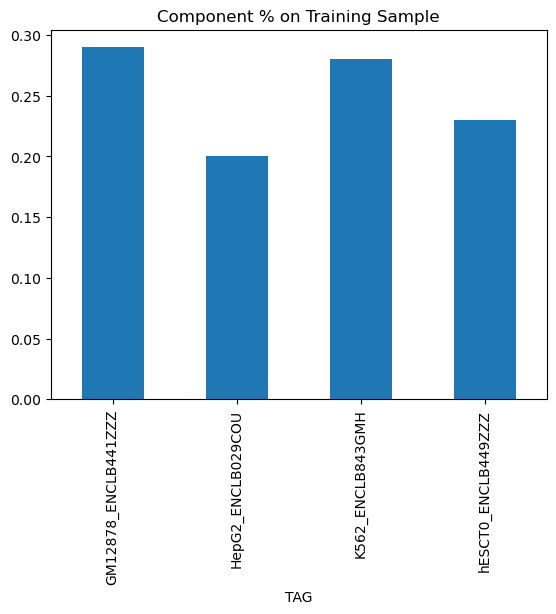

Generating Fasta and Motis: train
------------------------------
84 #seq used
Generating Motifs (all seqs)
Computing Motifs....


/var/folders/gt/6jkllgc91hn8rnxjr6vcstjr0000gn/T/ipykernel_62911/1400132713.py:88: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_train_shuffled['sequence'] = df_train_shuffled['sequence'].apply(lambda x : ''.join(random.sample(list(x), len(x)))  )


Scanning: 100%|█████████████████████████| 84/84 [00:03<00:00, 25.38 sequences/s]


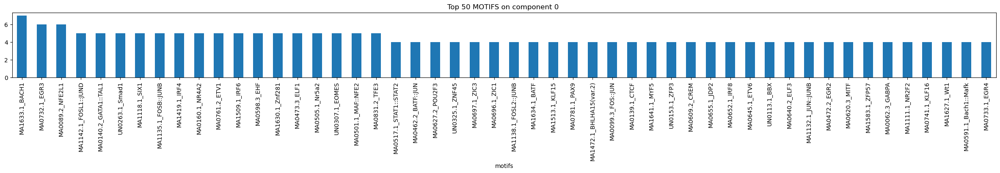

Generating Motifs per component
GM12878_ENCLB441ZZZ
number of sequences used to generate the motifs
1000 #seq used
Computing Motifs....
Scanning: 100%|█████████████████████████| 26/26 [00:03<00:00,  8.21 sequences/s]


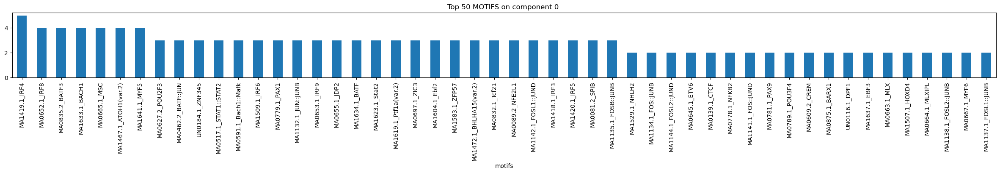

HepG2_ENCLB029COU
number of sequences used to generate the motifs
1000 #seq used
Computing Motifs....
Scanning: 100%|█████████████████████████| 15/15 [00:02<00:00,  5.32 sequences/s]


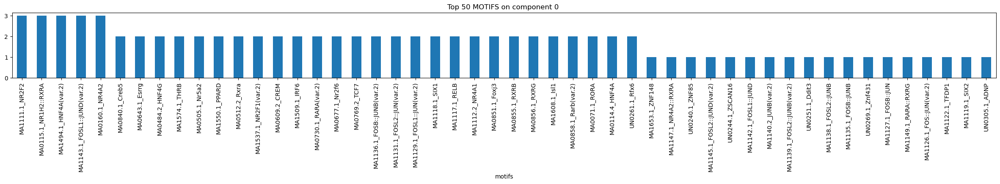

K562_ENCLB843GMH
number of sequences used to generate the motifs
1000 #seq used
Computing Motifs....
Scanning: 100%|█████████████████████████| 22/22 [00:02<00:00,  7.94 sequences/s]


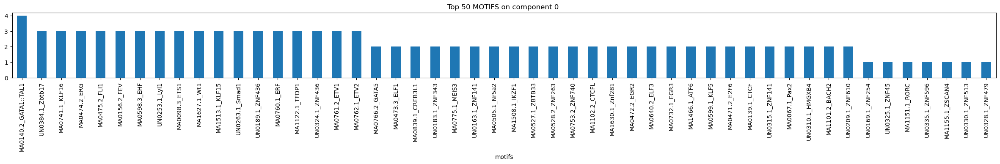

hESCT0_ENCLB449ZZZ
number of sequences used to generate the motifs
1000 #seq used
Computing Motifs....
Scanning: 100%|█████████████████████████| 21/21 [00:03<00:00,  6.31 sequences/s]


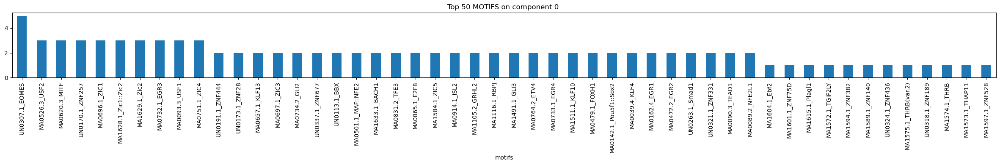

Generating Fasta and Motis: test
------------------------------
10 #seq used
Generating Motifs (all seqs)
Computing Motifs....
Scanning: 100%|█████████████████████████| 10/10 [00:02<00:00,  3.82 sequences/s]


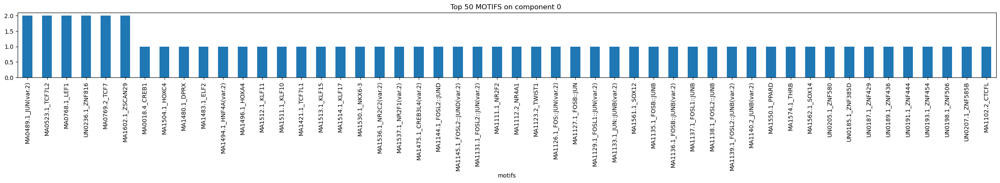

Generating Motifs per component
GM12878_ENCLB441ZZZ
number of sequences used to generate the motifs
1000 #seq used
Computing Motifs....
Scanning: 100%|███████████████████████████| 3/3 [00:02<00:00,  1.15 sequences/s]


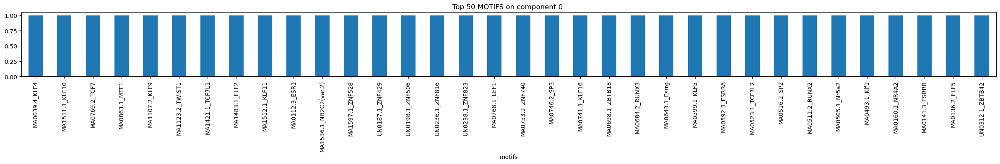

HepG2_ENCLB029COU
number of sequences used to generate the motifs
1000 #seq used
Computing Motifs....
Scanning: 100%|███████████████████████████| 2/2 [00:02<00:00,  1.33s/ sequences]


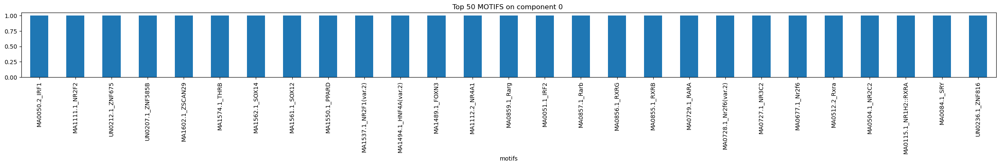

K562_ENCLB843GMH
number of sequences used to generate the motifs
1000 #seq used
Computing Motifs....
Scanning: 100%|███████████████████████████| 3/3 [00:02<00:00,  1.14 sequences/s]


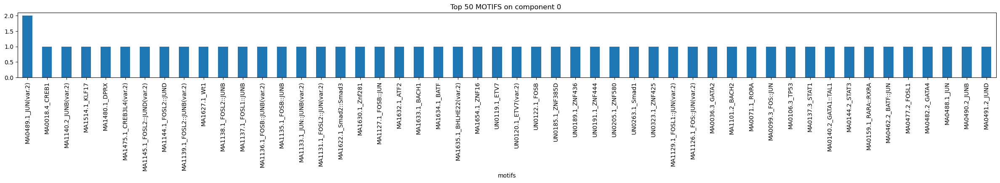

hESCT0_ENCLB449ZZZ
number of sequences used to generate the motifs
1000 #seq used
Computing Motifs....
Scanning: 100%|███████████████████████████| 2/2 [00:02<00:00,  1.30s/ sequences]


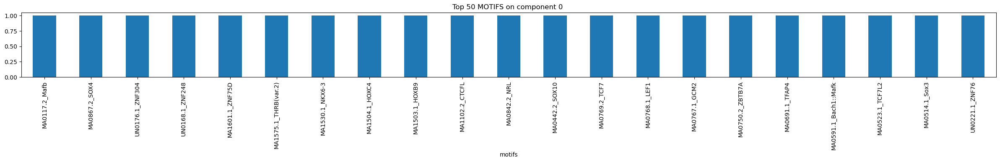

Generating Fasta and Motis: train_shuffle
------------------------------
6 #seq used
Generating Motifs (all seqs)
Computing Motifs....
Scanning: 100%|███████████████████████████| 6/6 [00:02<00:00,  2.28 sequences/s]


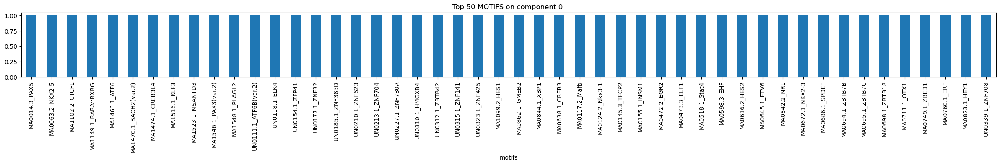

Generating Motifs per component
HepG2_ENCLB029COU
number of sequences used to generate the motifs
1000 #seq used
Computing Motifs....
Scanning: 100%|███████████████████████████| 3/3 [00:02<00:00,  1.13 sequences/s]


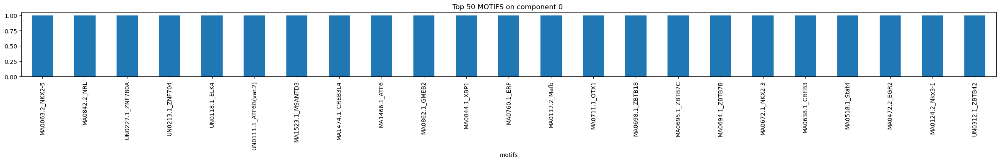

K562_ENCLB843GMH
number of sequences used to generate the motifs
1000 #seq used
Computing Motifs....
Scanning: 100%|███████████████████████████| 3/3 [00:02<00:00,  1.09 sequences/s]


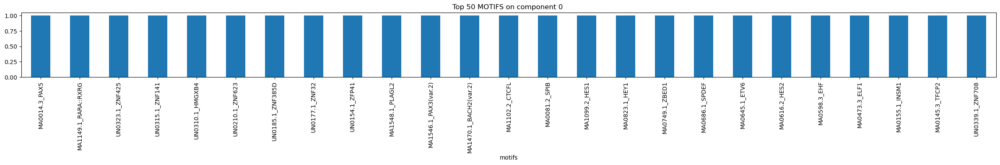

In [33]:
#code changes 1/20

import random

def motifs_from_fasta(fasta, generate_heatmap=True):
    print ('Computing Motifs....')
    !gimme scan $fasta -p  JASPAR2020_vertebrates -g hg38 > train_results_motifs.bed
    df_results_seq_guime = pd.read_csv('train_results_motifs.bed', sep='\t', skiprows=5, header=None)
    df_results_seq_guime['motifs'] = df_results_seq_guime[8].apply(lambda x: x.split( 'motif_name "'    )[1].split('"')[0]   )
    # if generate_heatmap:
    #     generate_heatmap_motifs(df_results_seq_guime)

    df_results_seq_guime[0] = df_results_seq_guime[0].apply(lambda x : '_'.join(  x.split('_')[:-1])    )
    df_results_seq_guime_count_out = df_results_seq_guime[[0,'motifs']].drop_duplicates().groupby('motifs').count()
    plt.rcParams["figure.figsize"] = (30,2)
    df_results_seq_guime_count_out.sort_values(0, ascending=False).head(50)[0].plot.bar()
    plt.title('Top 50 MOTIFS on component 0 ')
    plt.show()
    return df_results_seq_guime_count_out


class LoadingData():
    def __init__(self,input_csv,sample_number=0,subset_components=None, plot=True, change_component_index = True, limit_total_sequences=False, number_of_sequences_to_motif_creation=None ):
        '''subset_components: (NONE) list
                subset components should be a list of components to extract ex: [3,12,4,3]
           sample_number : 1000
               Total number o sequences
         '''
        
        self.csv = input_csv
        self.limit_total_sequences = limit_total_sequences
        self.plot = plot
        self.sample_number = sample_number
        self.subset_components = subset_components    # case none I need add all
        self.change_comp_index = change_component_index
        self.data =  self.read_csv()
        self.df_generate = self.experiment() 
        self.df_train_in, self.df_test_in , self.df_train_shuffled_in = self.create_train_groups()
        self.number_of_sequences_to_motif_creation = number_of_sequences_to_motif_creation
        self.train = None
        self.test = None
        self.train_shuffle = None
        self.get_motif()
        
    def read_csv(self):
        df =  pd.read_csv( self.csv , sep="\t")
        if self.change_comp_index:
            df['component']= df['component'] + 1
            
        if self.limit_total_sequences:
            print (f'Limiting total sequences {self.limit_total_sequences}')
            df = df.sample(self.limit_total_sequences)
            
        df.columns = [c.replace('seqname','chr') for c in df.columns.values]  # change this in simon original table
        return df
    def experiment(self):
        df_generate = self.data.copy()
        print (df_generate.head().columns)
        print ([c for c in self.subset_components])
        if self.subset_components != None and type(self.subset_components) == list:
            print (' or '.join([f'TAG == {c}' for c in self.subset_components]))
            df_generate = df_generate.query( ' or '.join([f'TAG == "{c}" ' for c in self.subset_components])).copy()
            print ('Subseting...')
        
        if self.plot:
            # I changed raw_sequence to sequence
            print (df_generate.head()) 
            (df_generate.groupby('TAG').count()['sequence']  / df_generate.groupby('TAG').count()['sequence'].sum() ).plot.bar()
            plt.title('Component % on Training Sample')
            plt.show()

        return df_generate
    
    
    def create_train_groups(self):
        
#         df_sampled = self.df_generate.sample(self.sample_number*2) #getting train and test
#         df_train = df_sampled.iloc[:self.sample_number].copy()
#         df_test = df_sampled.iloc[self.sample_number:].copy()

        #solve it inside the simon dataloader
    
        df_sampled = self.df_generate.query('chr != "chr1" ') 
        df_train = df_sampled.query('chr != "chr2" ') 
        df_test = self.df_generate.query('chr == "chr1" ') 
        df_train_shuffled = df_sampled.query('chr == "chr2" ') 
        
        df_train_shuffled['sequence'] = df_train_shuffled['sequence'].apply(lambda x : ''.join(random.sample(list(x), len(x)))  )
        return df_train , df_test , df_train_shuffled
        
        
    def get_motif(self):
        self.train = self.generate_motifs_and_fastas(self.df_train_in,  'train')
        self.test = self.generate_motifs_and_fastas(self.df_test_in, 'test')
        self.train_shuffle = self.generate_motifs_and_fastas(self.df_train_shuffled_in,'train_shuffle')
        
        
    def generate_motifs_and_fastas(self, df,name):
        '''return fasta anem , and dict with components motifs'''
        print ('Generating Fasta and Motis:', name)
        print ('---' * 10)
        fasta_saved = self.save_fasta(df, f"{name}_{'_'.join([str(c) for c in self.subset_components])}")
        print('Generating Motifs (all seqs)')
        motif_all_components = motifs_from_fasta(fasta_saved, False)
        print('Generating Motifs per component')
        train_comp_motifs_dict = self.generate_motifs_components(df)
        
        return {'fasta_name':fasta_saved ,
                'motifs': motif_all_components ,    
                'motifs_per_components_dict':train_comp_motifs_dict ,
                'dataset': df}
    
    
        
    def save_fasta(self, df , name_fasta, to_seq_groups_comparison=False):
        fasta_final_name = name_fasta + '.fasta'
        save_fasta_file= open(fasta_final_name, 'w')
        number_to_sample = df.shape[0] # case we dont want to limit the number of sequences used to calculate the motifs
        
        if to_seq_groups_comparison and self.number_of_sequences_to_motif_creation: # case we want, we select just the number defined in number_of_sequences_to_motif_creation
            number_to_sample = self.number_of_sequences_to_motif_creation
            
            
        print (number_to_sample, '#seq used')
        write_fasta_component = '\n'.join(df[['dhs_id', 'sequence', 'TAG']].head(number_to_sample).apply(lambda x : f'>{x[0]}_TAG_{x[2]}\n{x[1]}', axis=1).values.tolist())
        save_fasta_file.write(write_fasta_component)
        save_fasta_file.close()
        return fasta_final_name
    
    
    def generate_motifs_components(self, df ):
        final_comp_values = {}
        for comp,v_comp in df.groupby('TAG'):
            print (comp)
            print ('number of sequences used to generate the motifs')
            name_c_fasta = self.save_fasta(v_comp, 'temp_component' , to_seq_groups_comparison=True)
            final_comp_values[comp] = motifs_from_fasta(name_c_fasta, False)
        return final_comp_values


encode_data = LoadingData(DATA_PATH, change_component_index=False, subset_components=['GM12878_ENCLB441ZZZ',
                                                                                                                                    'hESCT0_ENCLB449ZZZ',
                                                                                                                                    'K562_ENCLB843GMH',
                                                                                                                                     'HepG2_ENCLB029COU'], limit_total_sequences = LIMIT_TOTAL_SEQUENCES, number_of_sequences_to_motif_creation=NUMBER_OF_SAMPLING_TO_COMPARE_CELLS)





In [34]:
torch.cuda.is_initialized()

False

In [35]:
# encode_data_test = LoadingData("K562_hESCT0_HepG2_GM12878_12k_sequences_per_group.txt", change_component_index=False, subset_components=['GM12878_ENCLB441ZZZ',
# 'hESCT0_ENCLB449ZZZ',
# 'K562_ENCLB843GMH',
#  'HepG2_ENCLB029COU'])

In [36]:
# def group_determining(x):
#     if x == 'chr1':
#         return 'test'
#     if x == 'chr2':
#         return 'validation'
#     return 'training'


# encode_data_test.data['data_label'] = encode_data_test.data['chr'].apply(group_determining)
# encode_data_test.data.groupby(['data_label']).count()
# encode_data_test.data

In [37]:
# encode_data_test.data.to_csv('selected_K562_hESCT0_HepG2_GM12878_12k_sequences_per_group.txt', sep='\t', index=None) # I use it to generate the dataset

In [38]:
# search by component and raw_sequence  side effects

In [39]:
# pd.read_csv('K562_hESCT0_HepG2_GM12878_12k_sequences_per_group.txt', sep='\t' )

In [40]:
df_results_seq_guime_count_train = encode_data.train['motifs']
df_results_seq_guime_count_test = encode_data.test['motifs']
df_results_seq_guime_count_shuffle = encode_data.train_shuffle['motifs']


final_comp_values_trian = encode_data.train['motifs_per_components_dict']
final_comp_values_test = encode_data.test['motifs_per_components_dict']
final_comp_values_shuffle = encode_data.train_shuffle['motifs_per_components_dict']


df = encode_data.train['dataset']
cell_components = df.sort_values('TAG')['TAG'].unique().tolist()  # I need to add this function inside the dataloader

In [41]:
# final_comp_values_trian

In [42]:
names_comp = '''7 Trophoblasts
5 CD8_cells
15 CD34_cells
9 Fetal_heart
12 Fetal_muscle
14 HMVEC(vascular)
3 hESC(Embryionic)
8 Fetal(Neural)
13 Intestine
2 Skin(stromalA)
4 Fibroblast(stromalB)
6 Renal(Cancer)
16 Esophageal(Cancer)
11 Fetal_Lung
10 Fetal_kidney
1 Tissue_Invariant'''.split(
    '\n'
)

labels_test = {int(x.split(' ')[0]): x.split(' ')[1] for x in names_comp}

In [43]:
def kl_comparison_between_dataset(first_dic, second_dict):
    final_comp_kl = []
    for k, v in first_dic.items():
        comp_array = []
        for k_second in second_dict.keys():
            kl_out = compare_motif_list(v, second_dict[k_second])
            comp_array.append(kl_out)
        final_comp_kl.append(comp_array)
    return final_comp_kl

In [44]:
def generate_heatmap_components(df_heat, x_label, y_label):
    plt.rcParams["figure.figsize"] = (10, 10)
    df_plot = pd.DataFrame(df_heat)
    print(cell_components)
    df_plot.columns = [x.split('_')[0] for x in cell_components]
    df_plot.index = df_plot.columns
    sns.heatmap(df_plot, cmap='Blues_r', annot=True, lw=0.1, vmax=1, vmin=0)
    plt.title(f'Kl divergence \n {x_label} sequences x  {y_label} sequences \n MOTIFS probabilities')
    plt.xlabel(f'{x_label} Sequences  \n(motifs dist)')
    plt.ylabel(f'{y_label} \n (motifs dist)')

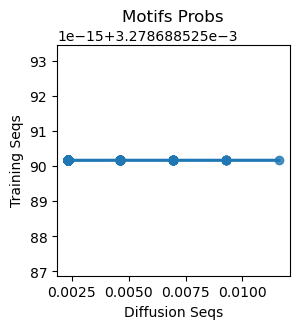

,motif,motif_a,motif_b,Diffusion_seqs,Training_seqs
0,MA0051.1_IRF2,2,1,0.004640,0.003279
1,MA0761.2_ETV1,1,1,0.002320,0.003279
2,MA0505.1_Nr5a2,1,1,0.002320,0.003279
3,MA1499.1_HOXB4,2,1,0.004640,0.003279
4,MA1132.1_JUN::JUNB,3,1,0.006961,0.003279
...,...,...,...,...,...
300,MA1535.1_NR2C1,1,1,0.002320,0.003279
301,MA0865.1_E2F8,1,1,0.002320,0.003279
302,MA0844.1_XBP1,1,1,0.002320,0.003279
303,MA0776.1_MYBL1,1,1,0.002320,0.003279


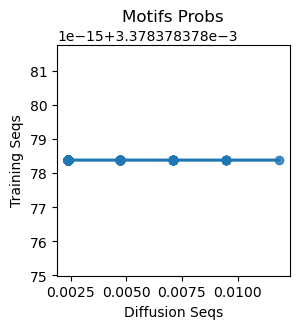

,motif,motif_a,motif_b,Diffusion_seqs,Training_seqs
0,MA0051.1_IRF2,2,1,0.004739,0.003378
1,MA0761.2_ETV1,1,1,0.002370,0.003378
2,MA1499.1_HOXB4,2,1,0.004739,0.003378
3,MA1132.1_JUN::JUNB,3,1,0.007109,0.003378
4,MA0864.2_E2F2,1,1,0.002370,0.003378
...,...,...,...,...,...
291,MA0844.1_XBP1,1,1,0.002370,0.003378
292,UN0212.1_ZNF675,1,1,0.002370,0.003378
293,MA0776.1_MYBL1,1,1,0.002370,0.003378
294,MA1561.1_SOX12,1,1,0.002370,0.003378


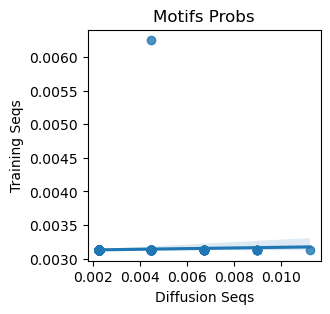

,motif,motif_a,motif_b,Diffusion_seqs,Training_seqs
0,MA0051.1_IRF2,2,1,0.004494,0.003125
1,MA0488.1_JUN,1,1,0.002247,0.003125
2,UN0308.1_ESR2,1,1,0.002247,0.003125
3,MA0665.1_MSC,4,1,0.008989,0.003125
4,MA1419.1_IRF4,5,1,0.011236,0.003125
...,...,...,...,...,...
314,MA1535.1_NR2C1,1,1,0.002247,0.003125
315,MA0865.1_E2F8,1,1,0.002247,0.003125
316,MA0776.1_MYBL1,1,1,0.002247,0.003125
317,MA1561.1_SOX12,1,1,0.002247,0.003125


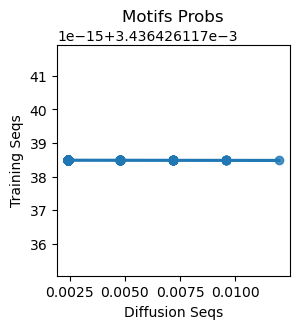

,motif,motif_a,motif_b,Diffusion_seqs,Training_seqs
0,MA0051.1_IRF2,2,1,0.004796,0.003436
1,MA0761.2_ETV1,1,1,0.002398,0.003436
2,MA1499.1_HOXB4,2,1,0.004796,0.003436
3,MA1132.1_JUN::JUNB,3,1,0.007194,0.003436
4,MA0864.2_E2F2,1,1,0.002398,0.003436
...,...,...,...,...,...
286,MA0844.1_XBP1,1,1,0.002398,0.003436
287,MA1575.1_THRB(var.2),1,1,0.002398,0.003436
288,MA0776.1_MYBL1,1,1,0.002398,0.003436
289,UN0221.1_ZNF76,1,1,0.002398,0.003436


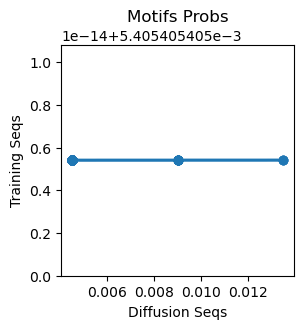

,motif,motif_a,motif_b,Diffusion_seqs,Training_seqs
0,MA1122.1_TFDP1,1,1,0.004505,0.005405
1,MA0051.1_IRF2,1,1,0.004505,0.005405
2,MA0124.2_Nkx3-1,1,1,0.004505,0.005405
3,MA0488.1_JUN,1,1,0.004505,0.005405
4,MA0761.2_ETV1,1,1,0.004505,0.005405
...,...,...,...,...,...
180,MA0521.1_Tcf12,1,1,0.004505,0.005405
181,MA0017.2_NR2F1,1,1,0.004505,0.005405
182,MA1127.1_FOSB::JUN,1,1,0.004505,0.005405
183,UN0221.1_ZNF76,1,1,0.004505,0.005405


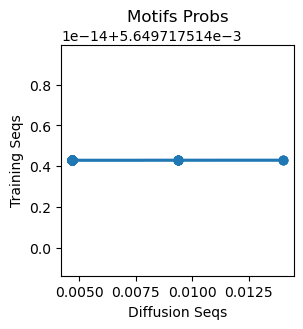

,motif,motif_a,motif_b,Diffusion_seqs,Training_seqs
0,MA1122.1_TFDP1,1,1,0.004673,0.00565
1,MA0051.1_IRF2,1,1,0.004673,0.00565
2,MA0124.2_Nkx3-1,1,1,0.004673,0.00565
3,MA0488.1_JUN,1,1,0.004673,0.00565
4,MA0761.2_ETV1,1,1,0.004673,0.00565
...,...,...,...,...,...
172,MA1127.1_FOSB::JUN,1,1,0.004673,0.00565
173,UN0221.1_ZNF76,1,1,0.004673,0.00565
174,MA1561.1_SOX12,1,1,0.004673,0.00565
175,UN0383.1_Nanog,1,1,0.004673,0.00565


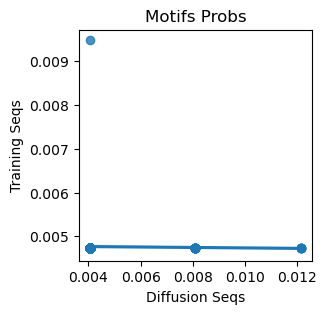

,motif,motif_a,motif_b,Diffusion_seqs,Training_seqs
0,MA1122.1_TFDP1,1,1,0.004049,0.004739
1,MA0051.1_IRF2,1,1,0.004049,0.004739
2,MA0124.2_Nkx3-1,1,1,0.004049,0.004739
3,MA0488.1_JUN,1,1,0.004049,0.004739
4,MA0761.2_ETV1,1,1,0.004049,0.004739
...,...,...,...,...,...
205,MA1127.1_FOSB::JUN,1,1,0.004049,0.004739
206,MA0018.4_CREB1,1,1,0.004049,0.004739
207,UN0191.1_ZNF444,1,1,0.004049,0.004739
208,UN0221.1_ZNF76,1,1,0.004049,0.004739


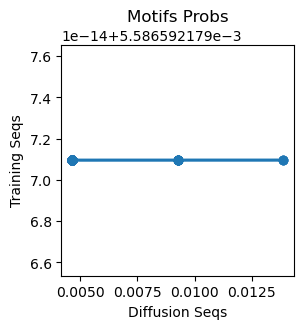

,motif,motif_a,motif_b,Diffusion_seqs,Training_seqs
0,MA1122.1_TFDP1,1,1,0.00463,0.005587
1,MA0051.1_IRF2,1,1,0.00463,0.005587
2,MA0124.2_Nkx3-1,1,1,0.00463,0.005587
3,MA0488.1_JUN,1,1,0.00463,0.005587
4,MA0761.2_ETV1,1,1,0.00463,0.005587
...,...,...,...,...,...
174,MA1575.1_THRB(var.2),1,1,0.00463,0.005587
175,MA0017.2_NR2F1,1,1,0.00463,0.005587
176,MA1127.1_FOSB::JUN,1,1,0.00463,0.005587
177,UN0221.1_ZNF76,1,1,0.00463,0.005587


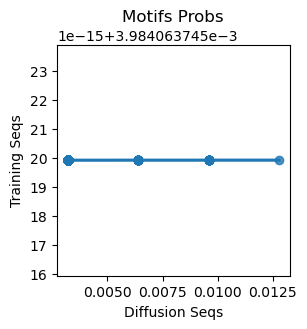

,motif,motif_a,motif_b,Diffusion_seqs,Training_seqs
0,MA0056.2_MZF1,1,1,0.003195,0.003984
1,MA0761.2_ETV1,3,1,0.009585,0.003984
2,MA0040.1_Foxq1,1,1,0.003195,0.003984
3,MA1122.1_TFDP1,3,1,0.009585,0.003984
4,MA1132.1_JUN::JUNB,1,1,0.003195,0.003984
...,...,...,...,...,...
246,MA0018.4_CREB1,1,1,0.003195,0.003984
247,MA1484.1_ETS2,1,1,0.003195,0.003984
248,UN0221.1_ZNF76,1,1,0.003195,0.003984
249,MA0002.2_RUNX1,1,1,0.003195,0.003984


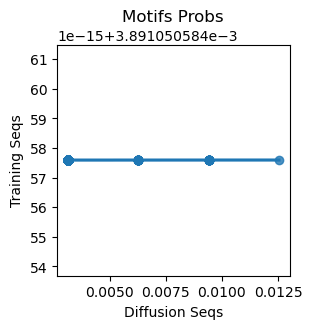

,motif,motif_a,motif_b,Diffusion_seqs,Training_seqs
0,MA0056.2_MZF1,1,1,0.003135,0.003891
1,MA0761.2_ETV1,3,1,0.009404,0.003891
2,MA0040.1_Foxq1,1,1,0.003135,0.003891
3,MA1122.1_TFDP1,3,1,0.009404,0.003891
4,MA0051.1_IRF2,1,1,0.003135,0.003891
...,...,...,...,...,...
252,UN0221.1_ZNF76,1,1,0.003135,0.003891
253,MA1561.1_SOX12,1,1,0.003135,0.003891
254,MA0002.2_RUNX1,1,1,0.003135,0.003891
255,MA0787.1_POU3F2,1,1,0.003135,0.003891


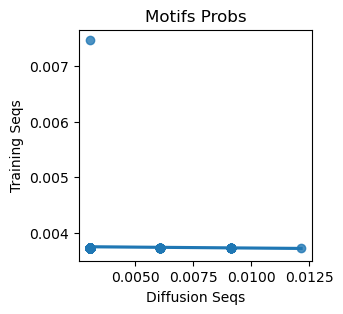

,motif,motif_a,motif_b,Diffusion_seqs,Training_seqs
0,MA0056.2_MZF1,1,1,0.003040,0.003731
1,MA0761.2_ETV1,3,1,0.009119,0.003731
2,MA0040.1_Foxq1,1,1,0.003040,0.003731
3,MA1122.1_TFDP1,3,1,0.009119,0.003731
4,MA0488.1_JUN,1,1,0.003040,0.003731
...,...,...,...,...,...
262,MA1127.1_FOSB::JUN,1,1,0.003040,0.003731
263,UN0221.1_ZNF76,1,1,0.003040,0.003731
264,MA0002.2_RUNX1,1,1,0.003040,0.003731
265,MA0787.1_POU3F2,1,1,0.003040,0.003731


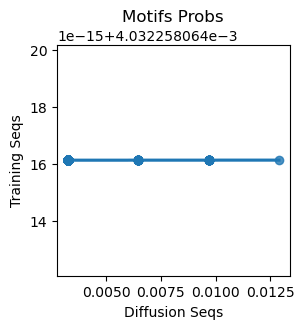

,motif,motif_a,motif_b,Diffusion_seqs,Training_seqs
0,MA0056.2_MZF1,1,1,0.003226,0.004032
1,MA0761.2_ETV1,3,1,0.009677,0.004032
2,MA0040.1_Foxq1,1,1,0.003226,0.004032
3,MA1122.1_TFDP1,3,1,0.009677,0.004032
4,MA1132.1_JUN::JUNB,1,1,0.003226,0.004032
...,...,...,...,...,...
243,MA0018.4_CREB1,1,1,0.003226,0.004032
244,MA1484.1_ETS2,1,1,0.003226,0.004032
245,UN0221.1_ZNF76,1,1,0.003226,0.004032
246,MA0002.2_RUNX1,1,1,0.003226,0.004032


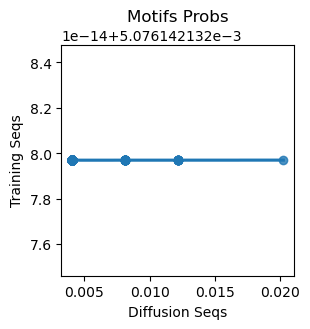

,motif,motif_a,motif_b,Diffusion_seqs,Training_seqs
0,MA1589.1_ZNF140,1,1,0.004049,0.005076
1,MA0056.2_MZF1,1,1,0.004049,0.005076
2,MA1152.1_SOX15,1,1,0.004049,0.005076
3,MA0797.1_TGIF2,1,1,0.004049,0.005076
4,UN0129.1_HSFY2,1,1,0.004049,0.005076
...,...,...,...,...,...
192,UN0307.1_EOMES,5,1,0.020243,0.005076
193,MA0142.1_Pou5f1::Sox2,2,1,0.008097,0.005076
194,MA0711.1_OTX1,1,1,0.004049,0.005076
195,UN0216.1_ZNF713,1,1,0.004049,0.005076


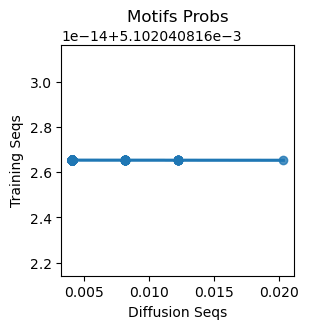

,motif,motif_a,motif_b,Diffusion_seqs,Training_seqs
0,MA1589.1_ZNF140,1,1,0.004065,0.005102
1,MA0056.2_MZF1,1,1,0.004065,0.005102
2,MA0051.1_IRF2,1,1,0.004065,0.005102
3,MA1152.1_SOX15,1,1,0.004065,0.005102
4,MA0797.1_TGIF2,1,1,0.004065,0.005102
...,...,...,...,...,...
191,MA0711.1_OTX1,1,1,0.004065,0.005102
192,UN0216.1_ZNF713,1,1,0.004065,0.005102
193,MA1561.1_SOX12,1,1,0.004065,0.005102
194,UN0191.1_ZNF444,2,1,0.008130,0.005102


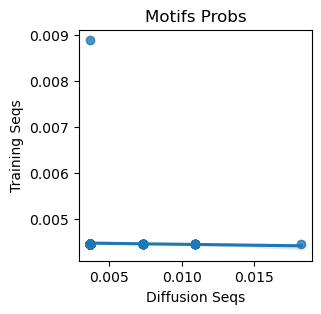

,motif,motif_a,motif_b,Diffusion_seqs,Training_seqs
0,MA1589.1_ZNF140,1,1,0.003650,0.004444
1,MA0056.2_MZF1,1,1,0.003650,0.004444
2,MA1152.1_SOX15,1,1,0.003650,0.004444
3,MA0488.1_JUN,1,1,0.003650,0.004444
4,MA0797.1_TGIF2,1,1,0.003650,0.004444
...,...,...,...,...,...
219,UN0307.1_EOMES,5,1,0.018248,0.004444
220,MA0142.1_Pou5f1::Sox2,2,1,0.007299,0.004444
221,MA0711.1_OTX1,1,1,0.003650,0.004444
222,UN0216.1_ZNF713,1,1,0.003650,0.004444


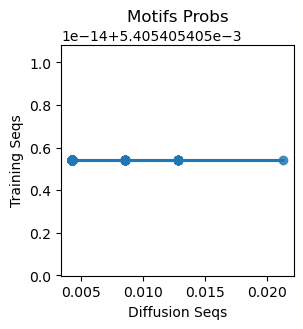

,motif,motif_a,motif_b,Diffusion_seqs,Training_seqs
0,MA1589.1_ZNF140,1,1,0.004255,0.005405
1,MA0056.2_MZF1,1,1,0.004255,0.005405
2,MA1152.1_SOX15,1,1,0.004255,0.005405
3,MA0797.1_TGIF2,1,1,0.004255,0.005405
4,UN0129.1_HSFY2,1,1,0.004255,0.005405
...,...,...,...,...,...
180,MA0142.1_Pou5f1::Sox2,2,1,0.008511,0.005405
181,UN0221.1_ZNF76,1,1,0.004255,0.005405
182,MA0711.1_OTX1,1,1,0.004255,0.005405
183,UN0216.1_ZNF713,1,1,0.004255,0.005405


In [45]:
heat_train_test = kl_comparison_between_dataset(final_comp_values_trian, final_comp_values_test)

In [46]:
torch.cuda.is_initialized()

False

['GM12878_ENCLB441ZZZ', 'HepG2_ENCLB029COU', 'K562_ENCLB843GMH', 'hESCT0_ENCLB449ZZZ']


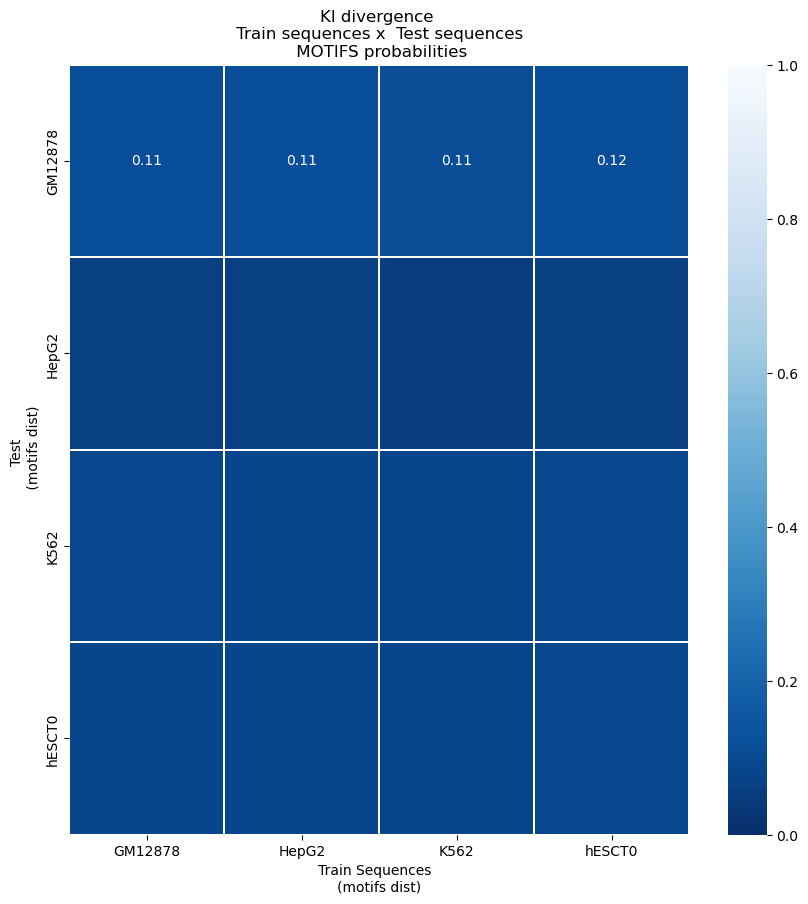

In [47]:
generate_heatmap_components(heat_train_test, 'Train', 'Test')

In [48]:
torch.cuda.is_initialized()

False

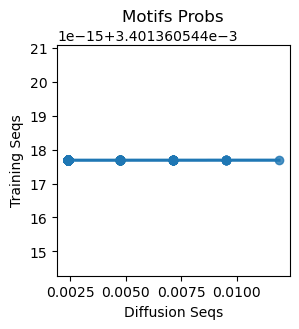

,motif,motif_a,motif_b,Diffusion_seqs,Training_seqs
0,MA0051.1_IRF2,2,1,0.004762,0.003401
1,MA0761.2_ETV1,1,1,0.002381,0.003401
2,MA0124.2_Nkx3-1,1,1,0.002381,0.003401
3,MA1499.1_HOXB4,2,1,0.004762,0.003401
4,MA1132.1_JUN::JUNB,3,1,0.007143,0.003401
...,...,...,...,...,...
289,MA0865.1_E2F8,1,1,0.002381,0.003401
290,MA0844.1_XBP1,1,1,0.002381,0.003401
291,MA0776.1_MYBL1,1,1,0.002381,0.003401
292,MA1561.1_SOX12,1,1,0.002381,0.003401


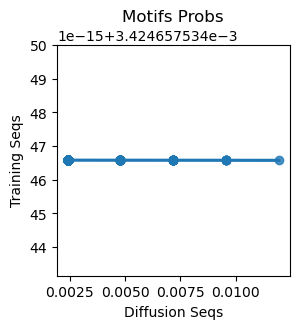

,motif,motif_a,motif_b,Diffusion_seqs,Training_seqs
0,MA0051.1_IRF2,2,1,0.004785,0.003425
1,MA0761.2_ETV1,1,1,0.002392,0.003425
2,MA1499.1_HOXB4,2,1,0.004785,0.003425
3,MA1132.1_JUN::JUNB,3,1,0.007177,0.003425
4,MA0864.2_E2F2,1,1,0.002392,0.003425
...,...,...,...,...,...
287,MA1535.1_NR2C1,1,1,0.002392,0.003425
288,MA0865.1_E2F8,1,1,0.002392,0.003425
289,MA0844.1_XBP1,1,1,0.002392,0.003425
290,MA0776.1_MYBL1,1,1,0.002392,0.003425


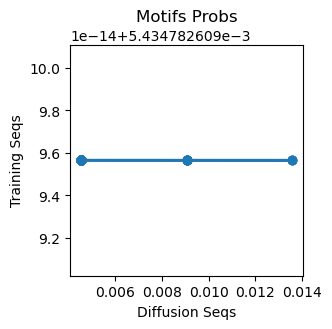

,motif,motif_a,motif_b,Diffusion_seqs,Training_seqs
0,MA1122.1_TFDP1,1,1,0.004525,0.005435
1,MA0051.1_IRF2,1,1,0.004525,0.005435
2,MA0124.2_Nkx3-1,1,1,0.004525,0.005435
3,MA0488.1_JUN,1,1,0.004525,0.005435
4,MA0761.2_ETV1,1,1,0.004525,0.005435
...,...,...,...,...,...
179,MA0017.2_NR2F1,1,1,0.004525,0.005435
180,MA1127.1_FOSB::JUN,1,1,0.004525,0.005435
181,UN0221.1_ZNF76,1,1,0.004525,0.005435
182,MA0711.1_OTX1,1,1,0.004525,0.005435


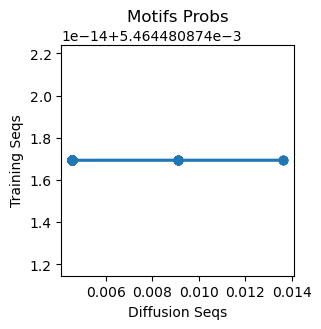

,motif,motif_a,motif_b,Diffusion_seqs,Training_seqs
0,MA1122.1_TFDP1,1,1,0.004545,0.005464
1,MA0051.1_IRF2,1,1,0.004545,0.005464
2,MA0124.2_Nkx3-1,1,1,0.004545,0.005464
3,MA0488.1_JUN,1,1,0.004545,0.005464
4,MA0761.2_ETV1,1,1,0.004545,0.005464
...,...,...,...,...,...
178,MA0521.1_Tcf12,1,1,0.004545,0.005464
179,MA0017.2_NR2F1,1,1,0.004545,0.005464
180,MA1127.1_FOSB::JUN,1,1,0.004545,0.005464
181,UN0221.1_ZNF76,1,1,0.004545,0.005464


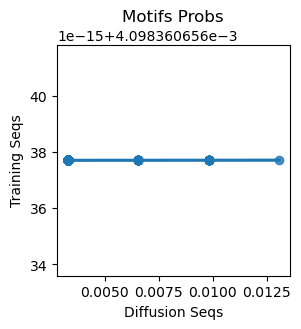

,motif,motif_a,motif_b,Diffusion_seqs,Training_seqs
0,MA0056.2_MZF1,1,1,0.003268,0.004098
1,MA0761.2_ETV1,3,1,0.009804,0.004098
2,MA0040.1_Foxq1,1,1,0.003268,0.004098
3,MA1122.1_TFDP1,3,1,0.009804,0.004098
4,MA0124.2_Nkx3-1,1,1,0.003268,0.004098
...,...,...,...,...,...
239,MA1484.1_ETS2,1,1,0.003268,0.004098
240,UN0221.1_ZNF76,1,1,0.003268,0.004098
241,MA0711.1_OTX1,1,1,0.003268,0.004098
242,MA0002.2_RUNX1,1,1,0.003268,0.004098


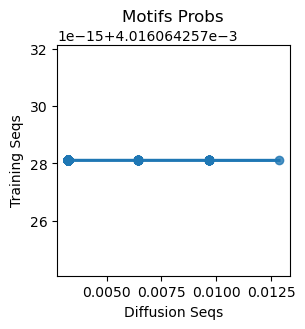

,motif,motif_a,motif_b,Diffusion_seqs,Training_seqs
0,MA0056.2_MZF1,1,1,0.003215,0.004016
1,MA0761.2_ETV1,3,1,0.009646,0.004016
2,MA0040.1_Foxq1,1,1,0.003215,0.004016
3,MA1122.1_TFDP1,3,1,0.009646,0.004016
4,MA1132.1_JUN::JUNB,1,1,0.003215,0.004016
...,...,...,...,...,...
244,MA0018.4_CREB1,1,1,0.003215,0.004016
245,MA1484.1_ETS2,1,1,0.003215,0.004016
246,UN0221.1_ZNF76,1,1,0.003215,0.004016
247,MA0002.2_RUNX1,1,1,0.003215,0.004016


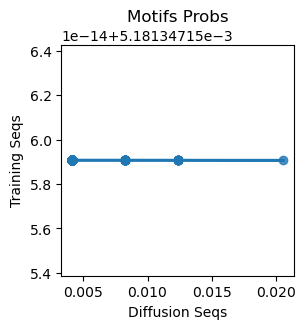

,motif,motif_a,motif_b,Diffusion_seqs,Training_seqs
0,MA1589.1_ZNF140,1,1,0.004115,0.005181
1,MA0056.2_MZF1,1,1,0.004115,0.005181
2,MA1152.1_SOX15,1,1,0.004115,0.005181
3,MA0124.2_Nkx3-1,1,1,0.004115,0.005181
4,MA0797.1_TGIF2,1,1,0.004115,0.005181
...,...,...,...,...,...
188,UN0307.1_EOMES,5,1,0.020576,0.005181
189,MA0142.1_Pou5f1::Sox2,2,1,0.008230,0.005181
190,MA0711.1_OTX1,1,1,0.004115,0.005181
191,UN0216.1_ZNF713,1,1,0.004115,0.005181


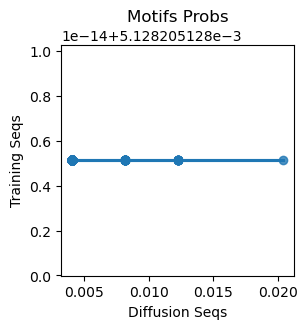

,motif,motif_a,motif_b,Diffusion_seqs,Training_seqs
0,MA1589.1_ZNF140,1,1,0.004082,0.005128
1,MA0056.2_MZF1,1,1,0.004082,0.005128
2,MA1152.1_SOX15,1,1,0.004082,0.005128
3,MA0797.1_TGIF2,1,1,0.004082,0.005128
4,UN0129.1_HSFY2,1,1,0.004082,0.005128
...,...,...,...,...,...
190,UN0307.1_EOMES,5,1,0.020408,0.005128
191,MA0142.1_Pou5f1::Sox2,2,1,0.008163,0.005128
192,MA0711.1_OTX1,1,1,0.004082,0.005128
193,UN0216.1_ZNF713,1,1,0.004082,0.005128


In [49]:
heat_train_shuffle = kl_comparison_between_dataset(final_comp_values_trian, final_comp_values_shuffle)

In [50]:
torch.cuda.is_initialized()

False

In [51]:
generate_heatmap_components(heat_train_shuffle, 'Train', 'shuffle')

['GM12878_ENCLB441ZZZ', 'HepG2_ENCLB029COU', 'K562_ENCLB843GMH', 'hESCT0_ENCLB449ZZZ']


ValueError: Length mismatch: Expected axis has 2 elements, new values have 4 elements

In [52]:
dna_alphabet = ['A', 'C', 'T', 'G']
df = encode_data.train['dataset']
x_train_seq = np.array([one_hot_encode(x, dna_alphabet, 200) for x in tqdm_notebook(df['sequence']) if 'N' not in x])
X_train = x_train_seq
X_train = np.array([x.T.tolist() for x in X_train])
X_train[X_train == 0] = -1
X_train.shape

/var/folders/gt/6jkllgc91hn8rnxjr6vcstjr0000gn/T/ipykernel_62911/2175193300.py:3: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  x_train_seq = np.array([one_hot_encode(x, dna_alphabet, 200) for x in tqdm_notebook(df['sequence']) if 'N' not in x])


  0%|          | 0/84 [00:00<?, ?it/s]

(84, 4, 200)

In [53]:
for x in tqdm_notebook(df['sequence']):
    if 'N' not in x:
        print(x)
        print(one_hot_encode(x, dna_alphabet, 200))

/var/folders/gt/6jkllgc91hn8rnxjr6vcstjr0000gn/T/ipykernel_62911/2812235786.py:1: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  for x in tqdm_notebook(df['sequence']):


  0%|          | 0/84 [00:00<?, ?it/s]

GCTCTCCCAACTCAGAACCACTGCTCGCTCACTCTTATCCGTAGAATCAATTCAGGATGCTTAGTGTAGCTGTCGCTGGCTGTTTCACTGACCTATCTCTTGCCGACAGCTCCCTCAAAACTATCTCCCCACCTCCCACACATACTTGAAAGGGAACTAATGTTTATGCTTTCAATATTATTTAAGTATATATTTTAATT
[[0. 0. 0. 1.]
 [0. 1. 0. 0.]
 [0. 0. 1. 0.]
 [0. 1. 0. 0.]
 [0. 0. 1. 0.]
 [0. 1. 0. 0.]
 [0. 1. 0. 0.]
 [0. 1. 0. 0.]
 [1. 0. 0. 0.]
 [1. 0. 0. 0.]
 [0. 1. 0. 0.]
 [0. 0. 1. 0.]
 [0. 1. 0. 0.]
 [1. 0. 0. 0.]
 [0. 0. 0. 1.]
 [1. 0. 0. 0.]
 [1. 0. 0. 0.]
 [0. 1. 0. 0.]
 [0. 1. 0. 0.]
 [1. 0. 0. 0.]
 [0. 1. 0. 0.]
 [0. 0. 1. 0.]
 [0. 0. 0. 1.]
 [0. 1. 0. 0.]
 [0. 0. 1. 0.]
 [0. 1. 0. 0.]
 [0. 0. 0. 1.]
 [0. 1. 0. 0.]
 [0. 0. 1. 0.]
 [0. 1. 0. 0.]
 [1. 0. 0. 0.]
 [0. 1. 0. 0.]
 [0. 0. 1. 0.]
 [0. 1. 0. 0.]
 [0. 0. 1. 0.]
 [0. 0. 1. 0.]
 [1. 0. 0. 0.]
 [0. 0. 1. 0.]
 [0. 1. 0. 0.]
 [0. 1. 0. 0.]
 [0. 0. 0. 1.]
 [0. 0. 1. 0.]
 [1. 0. 0. 0.]
 [0. 0. 0. 1.]
 [1. 0. 0. 0.]
 [1. 0. 0. 0.]
 [0. 0. 1. 0.]
 [0. 1. 0. 0.]
 [1. 0. 0. 0.]
 [1. 0. 0. 0.]
 [0. 0. 1. 0.]
 [0. 0. 1. 0.]
 [0. 1. 0. 0.]
 [1.

In [55]:
torch.cuda.is_initialized()

False

## OVERFIT

In [56]:
# #Case want to test overfiiting (1500epochs)
# X_OVERFIT = np.array(X_train[0].tolist() * 200).reshape(-1,4,200)
# X_train = X_OVERFIT

# Train initialize and Training loop

In [57]:
conditional_tag_to_numeric = {x: n + 1 for n, x in enumerate(df.TAG.unique())}  # check if this is changing order
conditional_numeric_to_tag = {n + 1: x for n, x in enumerate(df.TAG.unique())}  # check if this is changing order

list(conditional_tag_to_numeric.keys())

['K562_ENCLB843GMH',
 'GM12878_ENCLB441ZZZ',
 'hESCT0_ENCLB449ZZZ',
 'HepG2_ENCLB029COU']

In [58]:
torch.cuda.is_initialized()

False

In [59]:
# this needs to be changed is preety uggly
# conditional training init
conditional_tags_to_numeric = {n + 1: x for n, x in enumerate(df.TAG.unique())}  # check if this is changing order
cell_types = sorted(list(conditional_numeric_to_tag.keys()))
print(cell_types)
TOTAL_class_number = 17
x_train_cell_type = torch.from_numpy(df["TAG"].apply(lambda x: conditional_tag_to_numeric[x]).to_numpy())

[1, 2, 3, 4]


In [60]:
TOTAL_class_number = 17

In [61]:
torch.cuda.is_initialized()

False

In [62]:
torch.cuda.is_initialized()

False

In [63]:
def extract(a, t, x_shape, device=None):
    batch_size = t.shape[0]
    if device:
        # print('add device')
        a = a.to(device)
        t = t.to(device)

    # print(a.device, 'a', t.device, 't')

    out = a.gather(-1, t)
    # out = a.gather(-1) # to accelerate
    result = out.reshape(batch_size, *((1,) * (len(x_shape) - 1)))
    if device:
        result.to(device)
    return result

In [64]:
# import torch

# torch.tensor([[1,2,3,4], [1,2,3,4]]).gather(-1, torch.tensor([[1],[1]]) )
# torch.cuda.is_initialized()

In [65]:
# #Ploting images for a  foward pass example
# print (torch.cuda.is_initialized())
# for img_x_show, y in train_dl:
#   print (torch.cuda.is_initialized(), y)

#   for i in range(0,timesteps):
#     print (torch.cuda.is_initialized(), i)

In [66]:
# #Ploting images for a  foward pass example
# #I NEED TO RECOVER THE TRAIN_DL TO REPLOT IT
# for img_x_show, y in train_dl:

#   for i in range(0,timesteps):
#     if (i % 10) == 0:
#       print (i)
#       print (torch.cuda.is_initialized())
#       image_use = q_sample(img_x_show[0], t=torch.tensor([i]))
#       print (torch.cuda.is_initialized())
#       image_use_numpy = image_use.numpy()
#       print (torch.cuda.is_initialized())
#       plt.rcParams["figure.figsize"] = (20,1)
#       pd_seq = pd.DataFrame(image_use_numpy.reshape(4,200))
#       print (torch.cuda.is_initialized())
#       pd_seq.index = nucleotides
#       sns.heatmap(pd_seq, linewidth=1, cmap='bwr', center=0)
#       print (torch.cuda.is_initialized())
#       plt.show()
#       plt.rcParams["figure.figsize"] = (2,2)

#       plt.bar(['a', 'c', 't', 'g'],pd_seq.mean(1).T)
#       plt.show()


#   break

In [67]:
# device = "cuda" if torch#.cuda .is_available() else "cpu"
# device
# device  # from accelerate

# import os
# from torch.utils.data import DistributedSampler
# from torch.nn.parallel import DistributedDataParallel
# local_rank = int(os.environ.get("LOCAL_RANK", -1))
# print (local_rank)
# device = device = torch.device("cuda", local_rank)


# device

In [68]:
# torch.device("cuda")

In [69]:
# torch #.c u d a.empty_cache()

In [70]:
torch.cuda.is_initialized()

False

In [71]:
True

True

In [72]:
#!pip install livelossplot

In [73]:
# from livelossplot.outputs import TensorboardLogger
# !mkdir tensorboard_logs

In [74]:
from pathlib import Path


def save_model(milestone, step, accelerator, opt, model, ema_model, folder_path_string=''):
    results_folder = Path(folder_path_string)

    data = {
        'step': step,
        'model': accelerator.get_state_dict(model),
        #'opt': opt.state_dict(),
        #'ema': ema_model.state_dict(),
        #'ema':accelerator.get_state_dict(ema_model)
    }

    torch.save(data, str(results_folder / f'model_{milestone}.pt'))


def recreating_models():
    model = Unet_lucas(dim=200, channels=1, dim_mults=(1, 2, 4), resnet_block_groups=4, num_classes=TOTAL_class_number)

    # ema = EMA(0.995)
    # ema_model = copy.deepcopy(model).eval().requires_grad_(False)
    # optimizer = Adam(model.parameters(), lr=1e-4)  #it was 1e-4  ()

    return model


def load_model(model_name, folder_path_string=''):
    results_folder = Path(folder_path_string)
    data = torch.load(str(results_folder / model_name))

    # model = accelerator.unwrap_model(model)
    model = recreating_models()
    model.load_state_dict(data['model'])

    step = data['step']
    # opt.load_state_dict(data['opt'])
    # ema_model.load_state_dict(data['ema'])

    return model, step

In [ ]:
# data_x = torch.load('model_model_1500_sequences_per_group_K562_hESCT0_HepG2_GM12878_12k.pt')

In [ ]:
# model_x, ema_model_x, opt_x =  recreating_models()

In [ ]:
# data_x['ema'].keys()

In [ ]:
# ema_model_x.state_dict().keys()

In [ ]:
# load_model('model_model_1500_sequences_per_group_K562_hESCT0_HepG2_GM12878_12k.pt')

## Metrics: Train and Test should go down (train lower than test) and shuffle should go up

In [ ]:
# from livelossplot import PlotLosses
# from accelerate.utils import set_seed
# from accelerate import DistributedDataParallelKwargs

# epochs = EPOCHS
# save_and_sample_every =SAVE_AND_SAMPLE_EVERY_N_EPOCH
# epochs_loss_show = EPOCH_LOSS_SHOW_INTERVAL
# image_size = IMAGE_SIZE
# channels = 1
# batch_size = 10
# timesteps = TIME_STEPS
# TOTAL_class_number = 13


# ddp_kwargs = DistributedDataParallelKwargs(find_unused_parameters=True)
# accelerator = Accelerator(cpu = True, kwargs_handlers=[ddp_kwargs], split_batches =True)
# device = accelerator.device
# print(device)

# model = Unet_lucas(
#         dim = 200,
#         channels = 1,
#         dim_mults = (1,2,4),
#         resnet_block_groups = 4,
#         num_classes=TOTAL_class_number
# ) # LOL: this is hardcoded, changed 200 <- 2048

# print(BATCH_SIZE)

In [75]:
# # for i, batch in enumerate(train_dl):
# #     print("ha")
# X = torch.ones((BATCH_SIZE, 1, 200, 4))
# t = torch.randint(0, timesteps, (batch_size,))
# print(X.shape)
# labels = torch.ones(X.shape[0])
# model(X, t, classes=None)

<span id="papermill-error-cell" style="color:red; font-family:Helvetica Neue, Helvetica, Arial, sans-serif; font-size:2em;">Execution using papermill encountered an exception here and stopped:</span>

In [76]:
%env NCCL_DEBUG=info
#%env NCCL_IB_DISABLE=1
%env CUDA_LAUNCH_BLOCKING=1




from livelossplot import PlotLosses
from accelerate.utils import set_seed
from accelerate import DistributedDataParallelKwargs

def train_accelerate():
    epochs = EPOCHS
    save_and_sample_every =SAVE_AND_SAMPLE_EVERY_N_EPOCH
    epochs_loss_show = EPOCH_LOSS_SHOW_INTERVAL
    image_size = IMAGE_SIZE
    channels = 1
    batch_size = BATCH_SIZE
    timesteps = TIME_STEPS

    print (MODEL_NAME)
    set_seed(12345)
    ddp_kwargs = DistributedDataParallelKwargs(find_unused_parameters=True)
    accelerator = Accelerator(cpu=True, kwargs_handlers=[ddp_kwargs], split_batches =True)

    device = accelerator.device
    print(device)
    
    tf = T.Compose([T.ToTensor()])

    seq_dataset = SequenceDataset(seqs=X_train, c=x_train_cell_type, transform=tf)
    train_dl = DataLoader(seq_dataset, batch_size, shuffle=True, num_workers=1  )  #  , pin_memory=True)  to accelerate


    # define beta schedule
    betas = linear_beta_schedule(timesteps=timesteps, beta_end=0.2)
    betas.to(device)
    print (torch.cuda.is_initialized())
    #betas = cosine_beta_schedule(timesteps=timesteps,  s=0.0001 )
    # define alphas 
    alphas = 1. - betas
    alphas_cumprod = torch.cumprod(alphas, axis=0)
    print (torch.cuda.is_initialized())
    alphas_cumprod_prev = F.pad(alphas_cumprod[:-1], (1, 0), value=1.0)
    sqrt_recip_alphas = torch.sqrt(1.0 / alphas)
    print (torch.cuda.is_initialized())
    # calculations for diffusion q(x_t | x_{t-1}) and others
    sqrt_alphas_cumprod = torch.sqrt(alphas_cumprod)
    print (torch.cuda.is_initialized() )      
    #sqrt_one_minus_alphas_cumprod = torch.sqrt(1. - alphas_cumprod)
    sqrt_one_minus_alphas_cumprod = torch.sqrt(1. - alphas_cumprod)
    print (torch.cuda.is_initialized())
    # calculations for posterior q(x_{t-1} | x_t, x_0)
    posterior_variance = betas * (1. - alphas_cumprod_prev) / (1. - alphas_cumprod)
    print (torch.cuda.is_initialized())
    

    print (device)

    model = Unet_lucas(
        dim = 200,
            channels = 1,
        dim_mults = (1,2,4),
        resnet_block_groups = 4,
        num_classes=TOTAL_class_number
    )   # .c u d a()   To accelerate

    print ('model created')
    #model.to(device) # To accelerate

    optimizer = Adam(model.parameters(), lr=1e-4)  #it was 1e-4  ()

    print ('opt created')

    
    train_kl ,test_kl , shuffle_kl =1,1,1
    
    #live_kl = PlotLosses(groups={ 'KL':['train', 'test', 'shuffle'], 'DiffusionLoss':['loss'] }, outputs=[TensorboardLogger(logdir='tensorboard_logs/')])
    live_kl = PlotLosses(groups={ 'KL':['train', 'test', 'shuffle'], 'DiffusionLoss':['loss'] })

    print ('live_kl')

    #,'Diffusion_Loss':['loss']
    # live_kl.update({'train':train_kl, 'test':test_kl , 'shuffle':shuffle_kl , 'loss': 100})
    train_kl, test_kl , shuffle_kl = 1,1,1
    
    
    model, optimizer, train_dl = accelerator.prepare(model, optimizer, train_dl)   # To accelerate
    print ('preapare')


    
    if accelerator.is_main_process:
        ema = EMA(0.995)
        ema_model = copy.deepcopy(model).eval().requires_grad_(False)
        print ('ema created')

    model.output_attention = False

    for epoch in tqdm(range(epochs)):
        model.train()
        for step, batch in enumerate(train_dl):
            print(step)
            print(batch[0].shape)
            
            # accelerator.print(f"epoch {epoch} {step}")

            x, y = batch
            x = x.type(torch.float32)#.to(device)
            y = y.type(torch.long)#.to(device)

            #print (batch[0].dtype)
            batch_size = x.shape[0]
            #print (batch_size, 'batch_size')
            # batch_size = batch["pixel_values"].shape[0]
            # batch = batch["pixel_values"].to(device)
            # Algorithm 1 line 3: sample t uniformally for every example in the batch
            #t = torch.randint(0, timesteps, (batch_size,), device=device).long() # sampling a t to generate t and t+1 # to accelerate
            t = torch.randint(0, timesteps, (batch_size,)).long() # sampling a t to generate t and t+1

            #print (t.dtype)
            #loss = p_losses(model, batch, t, loss_type="l2")
            #print (y)
            
            with accelerator.autocast():
                loss = p_losses(model, x, t, y, loss_type="huber" , sqrt_alphas_cumprod_in= sqrt_alphas_cumprod, sqrt_one_minus_alphas_cumprod_in = sqrt_one_minus_alphas_cumprod, device=device)
                #loss.backward()
                print("loss complete")
            

            
            optimizer.zero_grad()
            accelerator.backward(loss)
            accelerator.wait_for_everyone()
            optimizer.step()
            
            accelerator.wait_for_everyone()
            if accelerator.is_main_process: 
                ema.step_ema(ema_model, model)


        if (epoch % epochs_loss_show) == 0:
            if accelerator.is_main_process: 
                live_kl.update({'train':train_kl, 'test':test_kl , 'shuffle':shuffle_kl , 'loss': loss.item()})
                live_kl.send()
                print(f" Epoch {epoch} Loss:", loss.item())

        # save generated images
        # if epoch != 0 and epoch % save_and_sample_every == 0 and accelerator.is_main_process: # to accelerate add main process
        #     model.eval()

        #     print ('saving')
        #     milestone = step // save_and_sample_every
        #     sample_bs = 2
        #     #This needs to be fixed to the random
        #     sampled = torch.from_numpy(np.random.choice(cell_types, sample_bs))
        #     random_classes = sampled.to(device) #.c u d a()  to accelerate
        #     additional_variables = {'model':model,
        #                             'timesteps':timesteps,
        #                             'device':device,
        #                             'betas':betas,
        #                             'sqrt_one_minus_alphas_cumprod':sqrt_one_minus_alphas_cumprod,
        #                             'sqrt_recip_alphas':sqrt_recip_alphas,
        #                             'posterior_variance': posterior_variance,
        #                             'accelerator': accelerator,
        #                            'image_size':image_size}
        #     #This samples is created just to show the images in the screen
        #     samples = sample(classes=random_classes, batch_size=sample_bs, channels=1, cond_weight=1, **additional_variables) # to accelerate
        #     n_print = 0
        #     for image, class_show in zip(samples[-1], random_classes):
        #       if n_print < 4:

        #         plt.rcParams["figure.figsize"] = (20,1)
        #         pd_seq = pd.DataFrame(image.reshape(4,200))
        #         pd_seq.index = nucleotides
        #         sns.heatmap(pd_seq, linewidth=1, cmap='bwr', center=0) 
        #         plt.show()
        #         plt.rcParams["figure.figsize"] = (2,2)

        #         plt.bar(['a', 'c', 't', 'g'],pd_seq.mean(1).T)
        #         plt.title(f'Class: {class_show}')
        #         plt.show()
        #         n_print = n_print + 1
        #     synt_df = sampling_to_metric(int(NUMBER_OF_SAMPLING_TO_COMPARE_CELLS/10), additional_variables= additional_variables) #50 * batch 10 is the number of sampled seqs
        #     train_kl = compare_motif_list(synt_df, df_results_seq_guime_count_train)
        #     test_kl  = compare_motif_list(synt_df, df_results_seq_guime_count_test)
        #     shuffle_kl = compare_motif_list(synt_df, df_results_seq_guime_count_shuffle)
        #     live_kl.update({'train':train_kl, 'test':test_kl , 'shuffle':shuffle_kl , 'loss': loss.item()})
        #     live_kl.send()
        #     print('KL_TRAIN', train_kl  , 'KL' )
        #     print('KL_TEST',  test_kl  , 'KL' )
        #     print('KL_SHUFFLE',  shuffle_kl , 'KL' )
            
            
        #     use_model_name = MODEL_NAME
            
        #     if SAVE_MODELS_BY_EPOCH:
        #         use_model_name =  f'epoch_{str(epoch)}_'+ MODEL_NAME
        #     save_model(milestone= use_model_name, step = epoch, accelerator=accelerator, opt=optimizer, model=model,  ema_model=ema_model, folder_path_string='')# We can inject a different name in milestone if we want to save different models per epoch

        #     #probably I need to unwrap it here
        #     #torch.save(model,'model_1500_sequences_per_group_K562_hESCT0_HepG2_GM12878_12k.model')

            
            
# from accelerate import notebook_launcher
# notebook_launcher(train_accelerate, num_processes=NUMBER_OF_GPUS)
# train_accelerate()

env: NCCL_DEBUG=info
env: CUDA_LAUNCH_BLOCKING=1


In [77]:
X_train.shape

(84, 4, 200)

In [82]:
X_train = torch.from_numpy(X_train.astype(np.float32))

In [83]:
X_new = torch.unsqueeze(X_train, 1)
X_new.shape

torch.Size([84, 1, 4, 200])

In [106]:
model = Unet_lucas(
        dim = 200,
        init_dim = 200,
        channels = 1,
        dim_mults = (1, 2, 4),
        resnet_block_groups = 4,
        num_classes=TOTAL_class_number
    )   # .c u d a()   To accelerate

In [ ]:
trainable_params = sum(
	p.numel() for p in model.parameters() if p.requires_grad
)
trainable_params

92214210

In [105]:
timesteps = 50
batch_size = 81
t = torch.randint(0, timesteps, (batch_size,)).long()
y = torch.ones(batch_size).long()
model(X_new[0:batch_size], t, None)


KeyboardInterrupt



In [ ]:
trainable_params = sum(
	p.numel() for p in model.parameters() if p.requires_grad
)
trainable_params

94572410

In [ ]:
X_train[80][0]

tensor([-1., -1.,  1., -1.,  1., -1.,  1., -1., -1., -1., -1.,  1., -1., -1.,
        -1., -1., -1., -1.,  1., -1., -1., -1., -1., -1., -1., -1., -1., -1.,
        -1., -1.,  1., -1., -1., -1.,  1., -1., -1., -1., -1.,  1., -1., -1.,
        -1.,  1., -1.,  1., -1., -1., -1., -1., -1., -1., -1., -1., -1.,  1.,
        -1., -1., -1., -1., -1., -1., -1., -1., -1., -1., -1., -1., -1., -1.,
        -1., -1., -1.,  1., -1., -1., -1., -1., -1.,  1.,  1.,  1.,  1., -1.,
         1.,  1.,  1., -1., -1., -1., -1., -1., -1., -1., -1., -1., -1.,  1.,
         1.,  1., -1., -1., -1., -1., -1., -1., -1., -1., -1.,  1., -1.,  1.,
        -1., -1., -1., -1., -1., -1., -1., -1.,  1., -1., -1., -1., -1., -1.,
        -1., -1., -1., -1., -1.,  1., -1., -1., -1., -1., -1., -1., -1., -1.,
        -1., -1.,  1., -1., -1.,  1.,  1.,  1., -1., -1., -1.,  1., -1., -1.,
        -1., -1., -1., -1., -1., -1., -1., -1., -1., -1., -1., -1., -1.,  1.,
        -1., -1., -1., -1., -1., -1., -1., -1., -1.,  1., -1., -

In [ ]:
train_accelerate()

model_48k_sequences_per_group_K562_hESCT0_HepG2_GM12878_12k
mps
False
False
False
False
False
False
mps
800
400
200
dim 200
final 200 1 Conv2d(200, 1, kernel_size=(1, 1), stride=(1, 1))
model created
opt created
live_kl
preapare
ema created


  0%|          | 0/10000 [00:00<?, ?it/s]

Traceback (most recent call last):
  File "<string>", line 1, in <module>
  File "/opt/anaconda3/envs/dna-diffuse/lib/python3.10/multiprocessing/spawn.py", line 116, in spawn_main
    exitcode = _main(fd, parent_sentinel)
  File "/opt/anaconda3/envs/dna-diffuse/lib/python3.10/multiprocessing/spawn.py", line 126, in _main
    self = reduction.pickle.load(from_parent)
AttributeError: Can't get attribute 'SequenceDataset' on <module '__main__' (built-in)>


RuntimeError: DataLoader worker (pid(s) 57892) exited unexpectedly

In [ ]:
live_kl.send()

NameError: name 'live_kl' is not defined

In [ ]:
# clean_process = !nvidia-smi | grep 3_9_1
# print (clean_process)
# for x in clean_process:
#     pid = x.split(' ')[13]
#     !kill -9 $pid

In [ ]:
# #load and unwrap the model
# USE THE SAVE AND LOAD FUNCTION FROM BITDIFUSION
# set_seed(12345)
# ddp_kwargs = DistributedDataParallelKwargs(find_unused_parameters=True)
# accelerator_outside = Accelerator(kwargs_handlers=[ddp_kwargs], split_batches =True)

# device_out = accelerator_outside.device
# model =  accelerator.unwrap_model('model_1500_sequences_per_group_K562_hESCT0_HepG2_GM12878_12k.model')
# model.to(device_out)

# from pathlib import Path

# def save(self, milestone, step, accelerator, opt, ema, folder_path_string):
#     results_folder = Path(folder_path_string)
#     if not self.accelerator.is_local_main_process:
#         return

#     data = {
#         'step': step,
#         'model': accelerator.get_state_dict(self.model),
#         'opt': opt.state_dict(),
#         'ema': ema.state_dict(),
#     }

#     torch.save(data, str(results_folder / f'model_{milestone}.pt'))

# def load(self, milestone, accelerator, folder_path_string ):
#     results_folder = Path(folder_path_string)
#     data = torch.load(str(results_folder / f'model_{milestone}.pt'))

#     model = accelerator.unwrap_model(self.model)
#     model.load_state_dict(data['model'])

#     step = data['step']
#     opt.load_state_dict(data['opt'])
#     ema.load_state_dict(data['ema'])

In [ ]:
model_loaded, step = load_model('model_48k_sequences_per_group_K562_hESCT0_HepG2_GM12878_12k.pt')

In [ ]:
# transform it in a function
timesteps = TIME_STEPS
image_size = IMAGE_SIZE
device = torch.device("cuda")
# define beta schedule
betas = linear_beta_schedule(timesteps=timesteps, beta_end=0.2)
betas.to(device)
# betas = cosine_beta_schedule(timesteps=timesteps,  s=0.0001 )
# define alphas
alphas = 1.0 - betas
alphas_cumprod = torch.cumprod(alphas, axis=0)
alphas_cumprod_prev = F.pad(alphas_cumprod[:-1], (1, 0), value=1.0)
sqrt_recip_alphas = torch.sqrt(1.0 / alphas)
# calculations for diffusion q(x_t | x_{t-1}) and others
sqrt_alphas_cumprod = torch.sqrt(alphas_cumprod)
# sqrt_one_minus_alphas_cumprod = torch.sqrt(1. - alphas_cumprod)
sqrt_one_minus_alphas_cumprod = torch.sqrt(1.0 - alphas_cumprod)
# calculations for posterior q(x_{t-1} | x_t, x_0)
posterior_variance = betas * (1.0 - alphas_cumprod_prev) / (1.0 - alphas_cumprod)
print(torch.cuda.is_initialized())

loaded_additional_variables = {
    'model': model_loaded,
    'timesteps': timesteps,
    'device': device,
    'betas': betas,
    'sqrt_one_minus_alphas_cumprod': sqrt_one_minus_alphas_cumprod,
    'sqrt_recip_alphas': sqrt_recip_alphas,
    'posterior_variance': posterior_variance,
    'image_size': image_size,
}


model_loaded = model_loaded.to(device)

class_in = torch.Tensor([2]).cuda()
sample_test_out, attention_out = sample(
    classes=class_in, batch_size=1, channels=1, cond_weight=1, get_cross_map=True, **loaded_additional_variables
)
model_loaded.output_attention = False


for i in range(49, 50):
    print(i)
    # image_use = q_sample(img_x_show[0], t=torch.tensor([i]))
    image_use_numpy = sample_test_out[i].reshape(4, 200)
    image_cross_numpy = attention_out[i].reshape(4, 200)
    plt.rcParams["figure.figsize"] = (20, 1)
    pd_seq = pd.DataFrame(image_use_numpy)
    pd_cross = pd.DataFrame(image_cross_numpy)

    pd_seq.index = nucleotides
    sns.heatmap(pd_seq, linewidth=1, cmap='bwr', center=0)
    plt.show()
    pd_cross.index = nucleotides
    sns.heatmap(pd_cross, linewidth=1, cmap='Greys')
    plt.title('Cross-attention')
    plt.show()
    plt.rcParams["figure.figsize"] = (2, 2)

    plt.bar(['a', 'c', 't', 'g'], pd_seq.mean(1).T)
    plt.show()

In [ ]:
# torch.save(model,'UNET_FULL_MODEL_7000_EPOCHS_400_4_groups_CELLS.model')

In [ ]:
# ~6.5k

## Module metric by component

In [ ]:
def kl_comparison_generated_sequences(
    components_list, dict_targer_components, additional_variables=None, number_of_sequences_to_sample_by_component=500
):
    '''
    ex: components_list = [3, 8, 12, 15]
    '''
    final_comp_kl = []
    use_comp_list = components_list
    for r in use_comp_list:
        print(r), 'component'
        comp_array = []
        group_compare = r
        synt_df_cond = sampling_to_metric(
            int(number_of_sequences_to_sample_by_component / 10),
            True,
            group_compare,
            cond_weight_to_metric=1,
            additional_variables=additional_variables,
        )
        for k in use_comp_list:
            v = dict_targer_components[conditional_numeric_to_tag[k]]

            kl_out = compare_motif_list(synt_df_cond, v)
            print(r, k, kl_out)
            comp_array.append(kl_out)
        final_comp_kl.append(comp_array)
    return final_comp_kl

In [ ]:
# use_comp =  [3, 8, 12, 15]
use_comp = list(conditional_tag_to_numeric.values())
heat_new_sequences_test = kl_comparison_generated_sequences(
    use_comp,
    final_comp_values_trian,
    additional_variables=loaded_additional_variables,
    number_of_sequences_to_sample_by_component=N_SAMPLES_TO_TEST_METRICS,
)

In [ ]:
generate_heatmap_components(heat_new_sequences_test, 'DNA(DIFFUSION)', 'Train')

# The Lowest values should be present from the up to bottown diagonal ~ 1000 epochs 